Note: This script assumes python 3, and that data has been downloaded from https://doi.org/10.6084/m9.figshare.7970993.v1 and saved locally in a folder named SupplementaryTables

## Imports and Styling

In [77]:
import numpy as np
import pandas as pd
import os
from os.path import join
from scipy.stats import pearsonr, spearmanr, gaussian_kde, ttest_ind, fisher_exact, skew, kurtosis
from scipy.stats import normaltest, ttest_ind
from scipy.stats import norm as normaldist
from statsmodels.stats.multitest import fdrcorrection
from sklearn.metrics import cohen_kappa_score, roc_curve, roc_auc_score, precision_recall_curve, precision_score
from sklearn.metrics import recall_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from adjustText import adjust_text
from statsmodels.stats.multitest import fdrcorrection


from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import seaborn as sns
%matplotlib inline

from matplotlib import rcParams

rcParams['figure.dpi'] = 600
rcParams['font.size'] = 8

rcParams['font.sans-serif'] = ['Arial', 
                               'DejaVu Sans',
                              'Bitstream Vera Sans',
                              'Computer Modern Sans Serif',
                              'Lucida Grande',
                              'Verdana',
                              'Geneva',
                              'Lucid',
                              'Helvetica',
                              'Avant Garde',
                              'sans-serif']

In [5]:
rcParams['figure.dpi'] = 600
rcParams['font.size'] = 8

In [6]:
reduced_colors = sns.cubehelix_palette(
    20, #broad_data['unprocessed'].shape[1],
    start=-.55, dark=.2, light=.7, rot=.2, reverse=True, hue=.6,
    as_cmap=True
)

## Utility Functions

In [2]:
def simpleaxis(ax=None):
        '''removes the top and right boundaries from pyplot plots for aesthetic reasons'''
        if ax is None:
                ax = plt.gca()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

In [3]:
def covar(A, B=None, axis=0):
    '''Calculates the correlation matrix between the columns of 1 or 2 dataframes'''
    #adapted from https://stackoverflow.com/a/30143754/8691282
    if B is None:
        B = A
    assert all(A.index == B.index), "covar expects matrices with identical indices"
    if axis == 0:
        A = A.T
        B = B.T
    elif axis != 1:
        raise ValueError('axis must be 0 or 1, not %r' %axis)
    A_mA = A.subtract(A.mean(axis=1), axis=0)
    A_mA[A_mA.isnull()] = 0
    B_mB = B.subtract(B.mean(axis=1), axis=0)
    B_mB[B_mB.isnull()] = 0

    # Sum of squares across rows
    ssA = (A_mA**2).sum(axis=1).values
    ssB = (B_mB**2).sum(axis=1).values

    # Finally get corr coeff
    out = pd.DataFrame(np.dot(A_mA.values,B_mB.T.values)/np.sqrt(np.dot(ssA[:,None],ssB[None])),
                        index=A.index, columns=B.index)
    return out

In [4]:
def left_pvalue(null, observed):
    null = sorted(null.dropna())
    observed = observed.dropna()
    sort = observed.index[np.argsort(observed)]
    return pd.Series(
        np.searchsorted(null, observed.loc[sort]) / len(null),
        index=observed.index[sort]).loc[observed.index]

## Read In

In [8]:
if not os.path.isdir('FigurePanels'):
    os.mkdir('FigurePanels')

In [11]:
# point this to a folder containing the supplementary data files
folder = 'SupplementaryTables/'

In [12]:
broad_data = {}
broad_data['unprocessed'] = pd.read_csv(join(folder, "GeneScores_Broad.csv"), index_col=0)

In [13]:
broad_data['replicateMap'] = pd.read_csv(join(folder, "ReplicateMap_Broad.csv"), index_col=0)

In [14]:
broad_data['processed'] = pd.read_csv(join(folder, "ProcessedScores_Broad.csv"), index_col=0)

In [15]:
broad_data['corrected'] = pd.read_csv(join(folder, 'CorrectedScores_Broad.csv'), index_col=0)

In [16]:
broad_data["lfc"] = pd.read_csv(join(folder, "LogfoldChange_Broad.csv"), index_col=0)

In [18]:
broad_data['alternateTP'] = pd.read_csv(join(folder, "AlternateTimePointGeneScore_Broad.csv"), index_col=0)

broad_data['alternateLib'] = pd.read_csv(join(folder, "AlternateLibraryGeneScore_Broad.csv"), index_col=0)

broad_data['replicateMap'] = pd.read_csv(join(folder, "ReplicateMap_Broad.csv"), index_col=0)

In [19]:
broad_data['lfc_cell'] = broad_data['lfc'].groupby(broad_data['replicateMap'].cell_line, axis=1).median()

In [20]:
broad_data['normLRT'] = pd.read_csv(join(folder, "NormLRT_Broad.csv"), index_col=0).iloc[:, 0]

In [21]:
sanger_data = {}
sanger_data['lfc'] = pd.read_csv(join(folder, 'LogfoldChange_Sanger.csv'), index_col=0)

In [22]:
sanger_data['unprocessed'] = pd.read_csv(join(folder, 'GeneScores_Sanger.csv'), index_col=0)

In [23]:
sanger_data['processed'] = pd.read_csv(join(folder, 'ProcessedScores_Sanger.csv'), index_col=0)

In [24]:
sanger_data['corrected'] = pd.read_csv(join(folder, 'CorrectedScores_Sanger.csv'), index_col=0)

In [25]:
sanger_data['replicateMap'] = pd.read_csv(join(folder, "ReplicateMap_Sanger.csv"), index_col=0)

In [26]:
sanger_data['lfc_cell'] = sanger_data['lfc'].groupby(
    sanger_data['replicateMap'].loc[sanger_data['lfc'].columns, 'cell_line'], 
    axis=1
).median()

In [27]:
sanger_data['alternateTP'] = pd.read_csv(join(folder, 'AlternateTimePointGeneScore_Sanger.csv'), index_col=0)

sanger_data['alternateLine'] = pd.read_csv(join(folder, 'AlternateCellLineGeneScore_Sanger.csv'), index_col=0)

sanger_data['alternateLib'] = pd.read_csv(join(folder, 'AlternateLibraryGeneScore_Sanger.csv'), index_col=0)

sanger_data['alternateLibLine'] = pd.read_csv(
    join(folder, 'AlternateLibraryAndCellLineGeneScore_Sanger.csv'), 
    index_col=0)

In [28]:
sanger_data['normLRT'] = pd.read_csv(join(folder, "NormLRT_Sanger.csv"), index_col=0).iloc[:, 0]

In [29]:
guide_map_avana = pd.read_csv(join(folder, "GuideMap_Avana.csv"), index_col=0)

guide_map_ky = pd.read_csv(join(folder, "GuideMap_KY10.csv"), index_col=0)

In [30]:
essential_genes = pd.read_csv(join(folder, 'EssentialGenes.csv')).iloc[:, 0]

nonessential_genes = pd.read_csv(join(folder, 'NonessentialGenes.csv')).iloc[:, 0]

In [31]:
ssds = sanger_data['normLRT'].index[
    ((sanger_data['normLRT'] > 100) & (sanger_data['unprocessed'].mean(axis=1) > -.5)) |
    ((broad_data['normLRT'] > 100) & (broad_data['unprocessed'].mean(axis=1) > -.5)) 
]

In [32]:
with open(join(folder, "StronglySelectiveDependencies.csv"), 'w') as f:
    f.write('gene\n')
    for s in ssds:
        f.write(s + '\n')

In [33]:
late_essentials = pd.read_csv(join(folder, 'LateDependencies.csv')).iloc[:, 0]
early_essentials = pd.read_csv(join(folder, 'EarlyDependencies.csv')).iloc[:, 0]

In [34]:
# point this to a folder containing sample_info from DepMap_public_19Q3
sample_info = pd.read_csv('SupplementaryTables/sample_info.csv')

In [35]:
# dangerous - not recommended approach in general
clean_name_map = pd.Series(
     broad_data['unprocessed'].columns,
     index=[''.join([c.upper() for c in s if c.isalnum()])
                    for s in broad_data['unprocessed'].columns
                    ]
             )
clean_name_map.loc['U251MG'] = 'U251'
clean_name_map.drop('U251', inplace=True)

In [36]:
sample_info['cell_line_name'] = clean_name_map.loc[sample_info.stripped_cell_line_name].values

/Users/dempster/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """Entry point for launching an IPython kernel.


In [37]:
sample_info = sample_info.dropna(subset=['cell_line_name'])\
                .set_index('cell_line_name')\
                .loc[broad_data['unprocessed'].columns]

In [38]:
sanger_media = pd.read_excel('SupplementaryTables/FilesFromSanger/ScreenMedia_150819.xlsx')

sanger_media['Screen Media'].replace({'D/F12': 'DMEM:F12', 'R': 'RPMI', 'Unknown': np.nan}, inplace=True)

sanger_media = sanger_media.set_index('Cell Line Name').loc[sample_info.index]

In [40]:
screen_media = pd.DataFrame({"Sanger": sanger_media['Screen Media'], "Broad": sample_info['culture_medium']})

screen_media['Broad'] = screen_media['Broad'].apply(lambda s: str(s).split(' + ')[0])
screen_media['Broad'].replace({'DMEM:F12(1:1)': 'DMEM:F12'
                              }, inplace=True)
screen_media['Broad'] = screen_media['Broad'].apply(lambda s: str(s).split(' (')[0])
screen_media['Broad'].replace({'nan': np.nan,
                              }, inplace=True)


# Fig 1: Overall Gene Score Concordance

## Panel B: Agreement among all gene scores


 processed
% of Scores between -.5 and .5 in both Broad and Sanger: 89.57
Pearson: 0.669149 0.000000E+00
Spearman: 0.346586 0.000000E+00
N: 2465631


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/usr/local/lib/python3.6/site-packages/matplotlib/legend.py:1266: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  warnings.warn("You have mixed positional and keyword arguments, some "



 unprocessed
% of Scores between -.5 and .5 in both Broad and Sanger: 86.29
Pearson: 0.626680 0.000000E+00
Spearman: 0.410481 0.000000E+00
N: 2465631

 corrected
% of Scores between -.5 and .5 in both Broad and Sanger: 89.06
Pearson: 0.765427 0.000000E+00
Spearman: 0.550733 0.000000E+00
N: 2465631


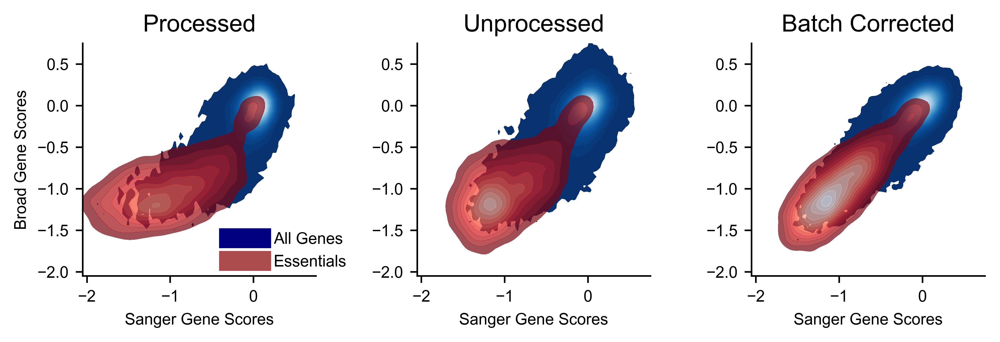

In [41]:
nsamples = int(1e5) #number of samples to use to calculate density plots

plt.close('all')
fig, axes = plt.subplots(1, 3, figsize=(7.0, 2.3))
for processing, title, ax in zip(
    ["processed", "unprocessed", "corrected"],
    ['Processed', 'Unprocessed', 'Batch Corrected'],
    axes
):

    plt.sca(ax)
    print('\n', processing)
    
    flat_sang = np.ravel(sanger_data[processing])
    flat_broad = np.ravel(broad_data[processing])
    mask = pd.notnull(flat_sang) & pd.notnull(flat_broad)
    print("%% of Scores between -.5 and .5 in both Broad and Sanger: %1.2f" % (100 * 
                            ((flat_sang > -.5) & (flat_sang < .5) & (flat_broad > -.5) & (flat_broad < .5)).mean()
                                                                              ))
    print("Pearson: %f %E" %pearsonr(flat_sang[mask], flat_broad[mask]))
    print("Spearman: %f %E" %spearmanr(flat_sang[mask], flat_broad[mask]))
    print("N:", mask.sum())
    #plt.scatter(flat_sang, flat_broad, alpha=.15, s=1, color='royalblue', label='All gene scores')
    ind = np.random.choice(np.arange(len(flat_sang))[mask], nsamples, replace=False)
    sns.kdeplot(
        flat_sang[ind],
        flat_broad[ind], 
        label='', levels=np.arange(.025, 8.01, .2), cmap="Blues_r", shade=True, shade_lowest=True, alpha=1
        )

    flat_sang_ess = np.ravel(sanger_data[processing].loc[essential_genes])
    flat_broad_ess = np.ravel(broad_data[processing].loc[essential_genes])
    mask = pd.notnull(flat_sang_ess) & pd.notnull(flat_broad_ess)
    sns.kdeplot(flat_sang_ess[mask], flat_broad_ess[mask], 
                alpha=.7, cmap='Reds_r', label='Essentials (Hart et al.)', shade=True,
                levels=np.arange(.2, 1.51, .1),
                shade_lowest=True)
    
    plt.xlim(-2.05, .75)
    plt.ylim(-2.05, .75)
    plt.gca().set_aspect('equal')
    simpleaxis()
    plt.title(title, fontsize=12)
    
    if processing == 'processed':
        plt.legend([
            plt.plot([0], [0], color='navy', lw=10, alpha=1),
            plt.plot([0], [0], color='darkred', lw=10, alpha=.7),
            ], labels=['All Genes', 'Essentials'], loc=(.6, 0), frameon=False)
        plt.ylabel('Broad Gene Scores')
    else:
        plt.ylabel('')
    plt.xlabel('Sanger Gene Scores')
    
plt.tight_layout()
plt.savefig('FigurePanels/scatter_all_scores.png', transparent=True)
#plt.savefig('FigurePanels/scatter_all_lfc_scores.pdf', transparent=True)

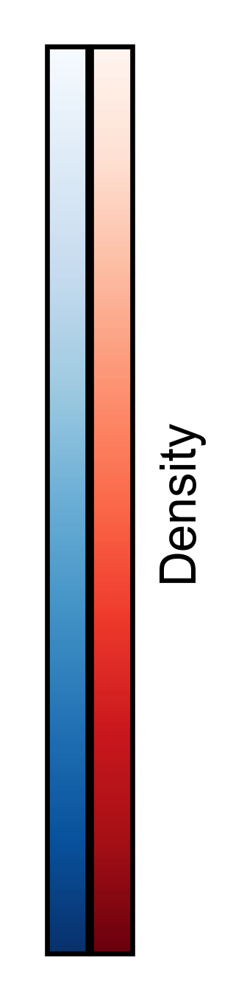

In [42]:


norm = mpl.colors.Normalize(vmin=0, vmax=1)
plt.close('all')
fig, axs = plt.subplots(1, 2, figsize=(.6, 2.3))
cb1 = mpl.colorbar.ColorbarBase(axs[0], 
                                cmap=ListedColormap(
                                    sns.color_palette("Blues_r", n_colors=200)
                                ), ticks=[],
                                norm=norm,
                                orientation='vertical')
cb2 = mpl.colorbar.ColorbarBase(axs[1], 
                                cmap=ListedColormap(
                                    sns.color_palette("Reds_r", n_colors=200)
                                ), ticks=[],
                                norm=norm,
                                orientation='vertical')
cb2.set_label('Density')
plt.tight_layout()
plt.subplots_adjust(wspace=.1)
plt.savefig("FigurePanels/scatter_colorbar.png")

## Supp. 1A-B: Agreement on average essentiality


 processed
Pearson: 0.784634 0.000000E+00
Spearman: 0.440480 0.000000E+00
N: 16773

 unprocessed
Pearson: 0.818454 0.000000E+00
Spearman: 0.552678 0.000000E+00
N: 16773


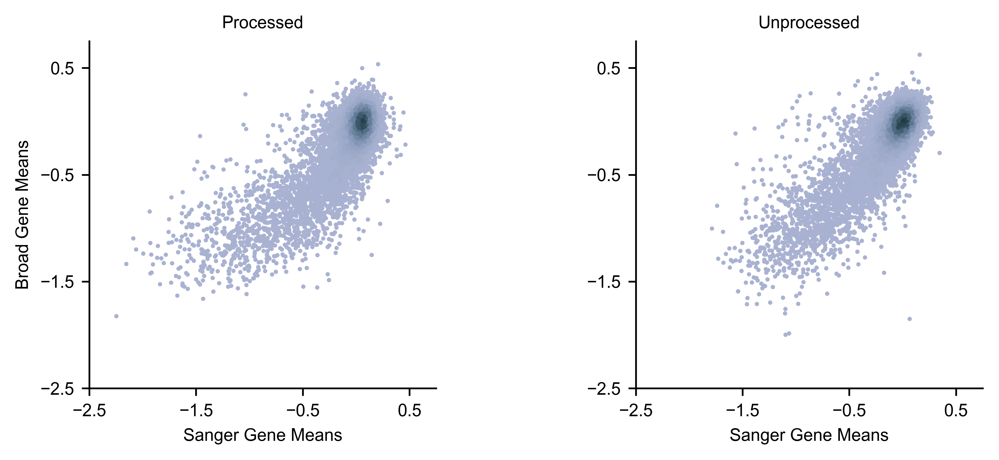

In [43]:
plt.close('all')
fig, axes = plt.subplots(1, 2, figsize=(7.5, 3.0))
for processing, title, ax in zip(
    ["processed", "unprocessed"],
    ['Processed', 'Unprocessed'],
    axes
):
    

    plt.sca(ax)
    print('\n', processing)
    
    print("Pearson: %f %E" %pearsonr(
        sanger_data[processing].mean(axis=1),
        broad_data[processing].mean(axis=1)
    ))
    print("Spearman: %f %E" %spearmanr(
        sanger_data[processing].mean(axis=1),
        broad_data[processing].mean(axis=1)
    ))
    print("N:", sanger_data[processing].shape[0])

    arr = np.array([
        sanger_data[processing].mean(axis=1).values,
        broad_data[processing].mean(axis=1).values
    ])
    density_est = gaussian_kde(arr, bw_method=.05)
    c = -density_est(arr)
    plt.scatter(
        sanger_data[processing].mean(axis=1),
        broad_data[processing].mean(axis=1), 
        s=1, c=c, 
        cmap=reduced_colors,#ListedColormap(sns.color_palette("GnBu_d", 10000).as_hex()), 
        alpha=1, label='Gene Means',
    )
#     sns.kdeplot(
#         sanger_data[processing].mean(axis=1),
#         broad_data[processing].mean(axis=1), 
#         shade=True, n_levels=30, cmap=reduced_colors, alpha=1, shade_lowest=False
#                         )
    simpleaxis()
    plt.yticks(np.arange(-2.5, 2, 1))
    plt.xticks(np.arange(-2.5, 2, 1))
    plt.xlim(-2.5, .75)
    plt.ylim(-2.5, .75)
    plt.gca().set_aspect('equal')
    
    plt.title(title, fontsize=8)
    plt.xlabel('Sanger Gene Means')
    if processing == 'processed':
        plt.ylabel('Broad Gene Means')
    else:
        plt.ylabel('')
   
plt.tight_layout()
plt.savefig('FigurePanels/gene_mean.png', transparent=True)
#plt.savefig('FigurePanels/gene_mean.pdf', dpi=600, transparent=True)

Pearson: 0.999686 0.000000E+00
Spearman: 0.999103 0.000000E+00
Pearson: 0.972083 0.000000E+00
Spearman: 0.956553 0.000000E+00


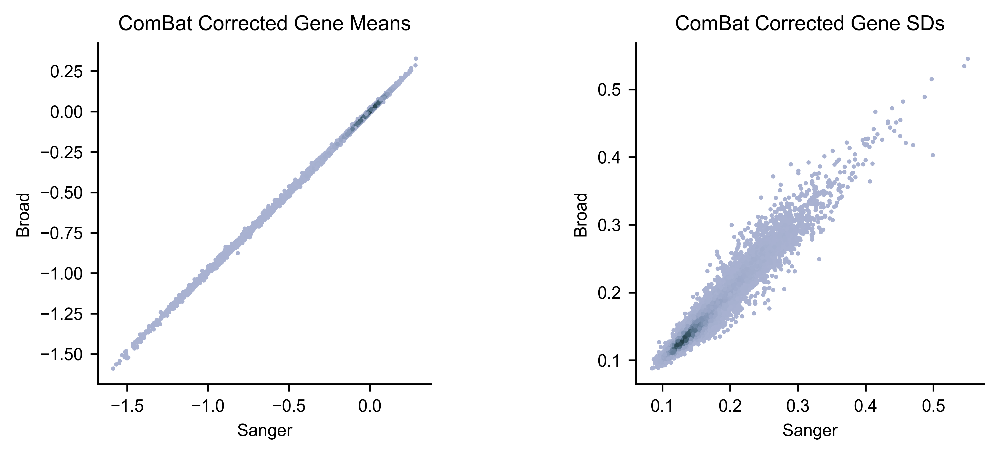

In [44]:
plt.close('all')
fig, axes = plt.subplots(1, 2, figsize=(7.5, 3.0))

plt.sca(axes[0])
arr = np.array([
        sanger_data['corrected'].mean(axis=1).values,
        broad_data['corrected'].mean(axis=1).values
])
density_est = gaussian_kde(arr, bw_method=.05)
c = -density_est(arr)
plt.scatter(
    sanger_data['corrected'].mean(axis=1),
    broad_data['corrected'].mean(axis=1), 
    s=1, c=c, 
    cmap=reduced_colors,#ListedColormap(sns.color_palette("GnBu_d", 10000).as_hex()), 
    alpha=1, label='Gene Means',
)
plt.xlabel("Sanger")
plt.ylabel("Broad")
plt.title("ComBat Corrected Gene Means")
simpleaxis()
print("Pearson: %f %E" %pearsonr(
        sanger_data['corrected'].mean(axis=1),
        broad_data['corrected'].mean(axis=1)
    ))
print("Spearman: %f %E" %spearmanr(
    sanger_data['corrected'].mean(axis=1),
    broad_data['corrected'].mean(axis=1)
))
plt.gca().set_aspect('equal')

plt.sca(axes[1])
arr = np.array([
        sanger_data['corrected'].std(axis=1).values,
        broad_data['corrected'].std(axis=1).values
])
density_est = gaussian_kde(arr, bw_method=.05)
c = -density_est(arr)
plt.scatter(
    sanger_data['corrected'].std(axis=1),
    broad_data['corrected'].std(axis=1), 
    s=1, c=c, 
    cmap=reduced_colors,#ListedColormap(sns.color_palette("GnBu_d", 10000).as_hex()), 
    alpha=1, label='Gene SDs',
)
print("Pearson: %f %E" %pearsonr(
        sanger_data['corrected'].std(axis=1),
        broad_data['corrected'].std(axis=1)
    ))
print("Spearman: %f %E" %spearmanr(
    sanger_data['corrected'].std(axis=1),
    broad_data['corrected'].std(axis=1)
))
plt.xlabel("Sanger")
plt.ylabel("Broad")
plt.title("ComBat Corrected Gene SDs")
simpleaxis()
plt.gca().set_aspect('equal')

plt.tight_layout()
plt.savefig('FigurePanels/combat_mean_variance.png', transparent=True)

## Panel C: Rank of Gene Score in Cell Line vs Cell Line rank for Gene

In [45]:
def essential_ranking(df):
    return  df.rank(axis=0, pct=True)[
                (df+np.random.uniform(-1e-16, 1e-16, size=df.shape)).rank(axis=1) == int(np.round(.9*df.shape[1]))
            ].stack().reset_index().sort_values('gene').set_index('gene')[0]

broad_essential_ranking = essential_ranking(broad_data['unprocessed'])
sanger_essential_ranking = essential_ranking(sanger_data['unprocessed'])

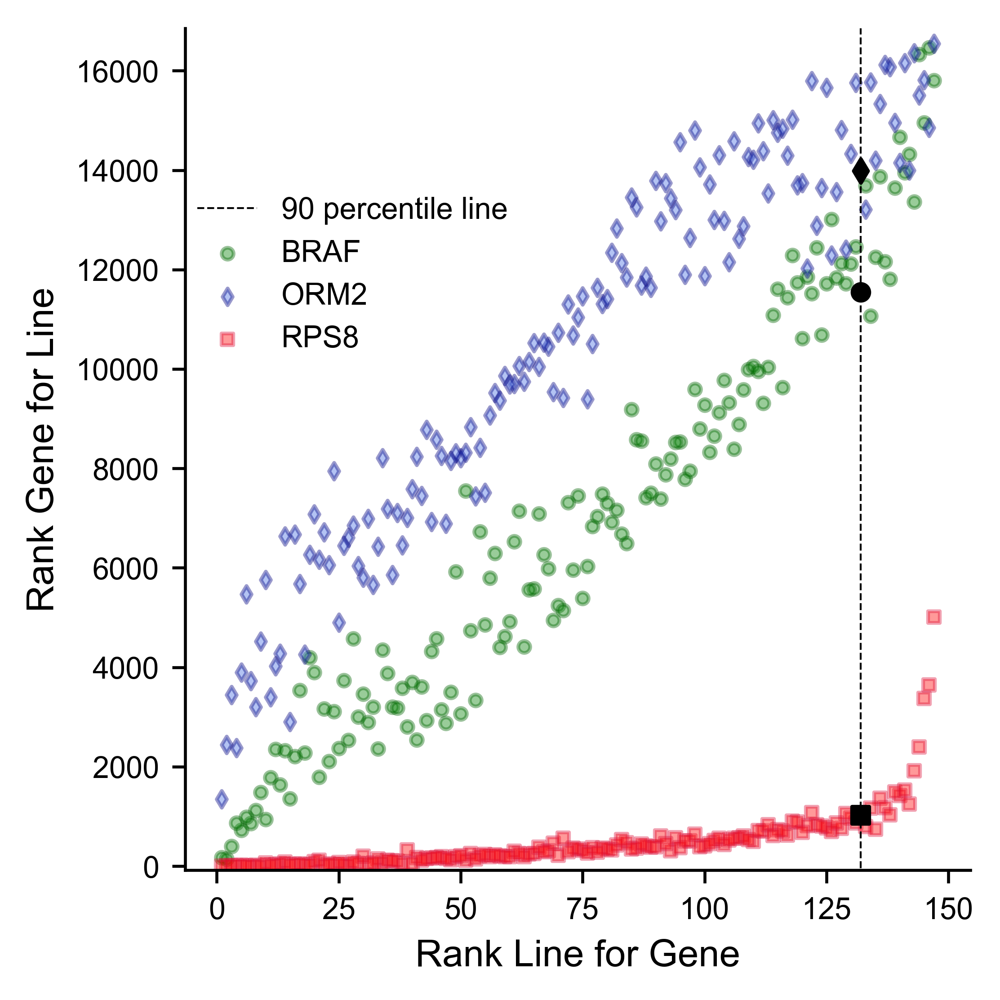

In [46]:
def essential_example(df, gene):
    rank1 = df.rank(axis=1, pct=False).loc[gene]
    rank2 = df.rank(axis=0, pct=False).loc[gene]
    return rank1, rank2

ninetieth = int(np.round(.9*broad_data['unprocessed'].shape[1]))

plt.close('all')
plt.figure(figsize=(3.75, 3.75))
for gene, marker, color, edgecolor in zip(
    ['BRAF', 'ORM2', 'RPS8'],
    ['o', 'd', 's'],
    ['green', 'royalblue', 'red'],
    ['darkgreen', 'navy', 'crimson']
):
    rank1, rank2 = essential_example(broad_data['unprocessed'], gene)
    plt.scatter(rank1, rank2, s=10, label=gene, marker=marker, color=color, alpha=.4, edgecolor=edgecolor)
    cell = rank1.index[rank1 == ninetieth]
    plt.scatter(rank1.loc[cell], rank2.loc[cell], label=None, marker=marker, color='black', s=20)

simpleaxis()
plt.xlabel("Rank Line for Gene", fontsize=10)
plt.ylabel("Rank Gene for Line", fontsize=10)
plt.plot([ninetieth, ninetieth], plt.gca().get_ylim(), '--', color='black', lw=.5, label="90 percentile line")
plt.legend(frameon=False, loc=(0, .6))
plt.ylim(-.005 * len(broad_essential_ranking), 1.005 * len(broad_essential_ranking))
plt.tight_layout()
plt.savefig("FigurePanels/essentiality_rank_examples.png", transparent=True)
plt.savefig("FigurePanels/essentiality_rank_examples.pdf", transparent=True)

## Panel D: 90th Percentile Rankings of Genes

In [47]:
def find_essentials(gene_effect, percentile):
    '''
    find a list of essential genes based on consistently high dependency score in large number of cell lines
    Parameters:
        gene_effect: matrix with genes as rows
        percentile: fraction of cell lines a gene must exceed some dependency threshold 
                    in order to be considered panessential
    Returns:
        dependency threshold value
        list of essential genes
    '''
    ranks = gene_effect.rank(axis=0, pct=True)
    ranks_lines = ranks.rank(axis=1, pct=True)
    gene_scores = ranks[ranks_lines > percentile].min(axis=1)
    kde = gaussian_kde(gene_scores.dropna(), bw_method=.1)
    test_points = np.arange(.1, .8, .001)
    #natural cutoff suggested by the data:
    threshold = test_points[np.argmin(kde(test_points))]
    if threshold > 0.3:
        raise RuntimeError('found threshold for calling essential genes too high at %f' %threshold)
    essentials = gene_scores.index[gene_scores < threshold]
    ess_mean = gene_effect.loc[essentials].mean().mean()
    if ess_mean > -.5:
        raise RuntimeError('the mean of all %i found essential genes (%f) is higher than expected' %(len(essentials), ess_mean))
    return threshold, essentials

broad_thresh, broad_ess = find_essentials(broad_data['unprocessed'], .9)
sanger_thresh, sanger_ess = find_essentials(sanger_data['unprocessed'], .9)

In [48]:
with open(join(folder, "CommonEssentials_Broad.csv"), 'w') as f:
    f.write("gene\n")
    for s in broad_ess:
        f.write(s + '\n')
with open(join(folder, "CommonEssentials_Sanger.csv"), 'w') as f:
    f.write("gene\n")
    for s in sanger_ess:
        f.write(s + '\n')

N: 16773
Cohen's kappa: k: 0.736
Fisher's Exact f: 149.312, p: 0.000000E+00


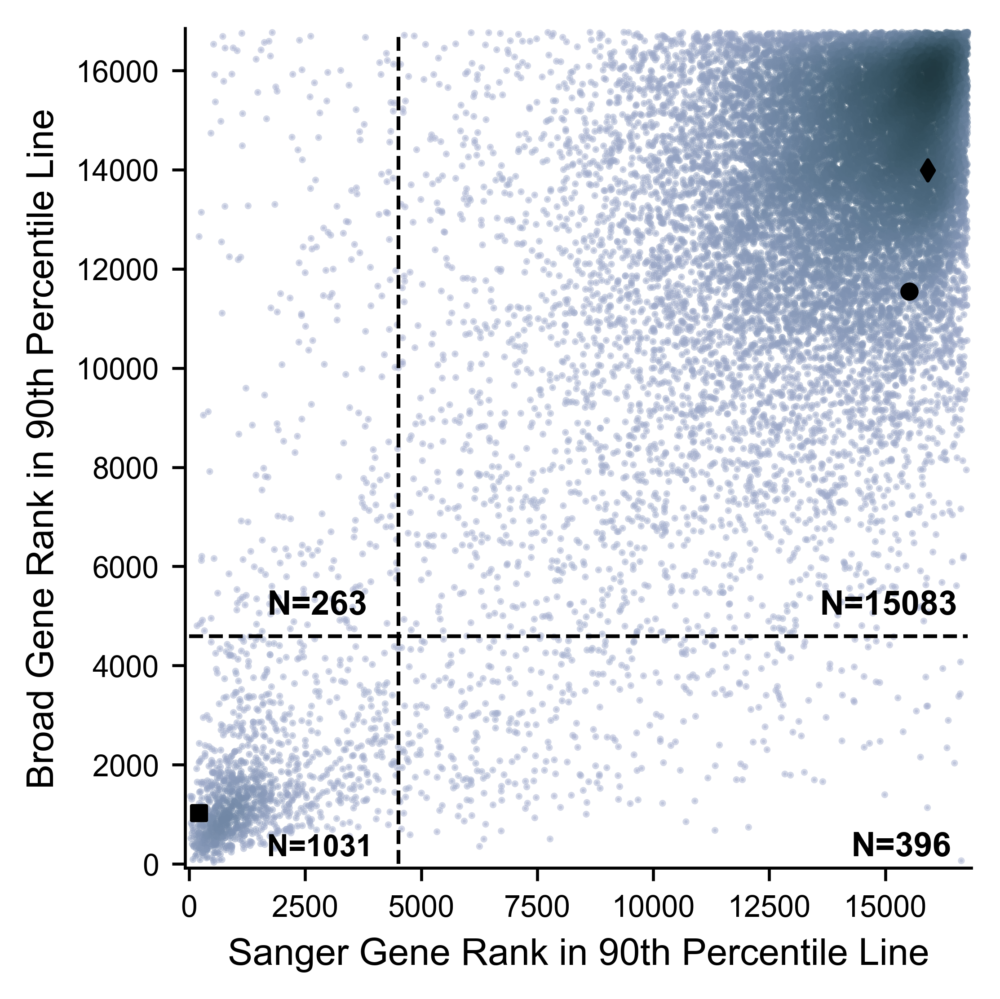

In [49]:
plt.close('all')
plt.figure(figsize=(3.75, 3.75))

arr = np.array([sanger_essential_ranking, broad_essential_ranking])
density_est = gaussian_kde(arr, bw_method=.1)
c = -density_est(arr)
plt.scatter(sanger_essential_ranking * len(sanger_essential_ranking),
            broad_essential_ranking * len(broad_essential_ranking),
            s=.7, alpha=.5,
           c=c, cmap=reduced_colors)
# sns.kdeplot(
#     sanger_essential_ranking, broad_essential_ranking,
#     shade=True, n_levels=np.arange(1, 14, 1), cmap='Purples_r', alpha=1, shade_lowest=True
#                     )
simpleaxis()
plt.xlim(-.005 * len(sanger_essential_ranking), 1.005 * len(sanger_essential_ranking))
plt.ylim(-.005 * len(broad_essential_ranking), 1.005 * len(broad_essential_ranking))
plt.plot([0, len(sanger_essential_ranking)], 
         [broad_thresh * len(broad_essential_ranking), broad_thresh * len(broad_essential_ranking)],
         '--', lw=1, color="black")
plt.plot([sanger_thresh * len(sanger_essential_ranking), sanger_thresh* len(sanger_essential_ranking)], 
         [0, len(broad_essential_ranking)],  
         '--', lw=1, color="black")

print("N:", len(sanger_essential_ranking))

print("Cohen's kappa: k: %1.3f" % cohen_kappa_score(
    (sanger_essential_ranking < sanger_thresh), (broad_essential_ranking < broad_thresh)
)) 
sanger_essential = (sanger_essential_ranking < sanger_thresh)
broad_essential = (broad_essential_ranking < broad_thresh)
sEss_bEss = (sanger_essential & broad_essential).sum()
sNess_bEss = (~sanger_essential & broad_essential).sum()
sEss_bNess = (sanger_essential & ~broad_essential).sum()
sNess_bNess = (~sanger_essential & ~broad_essential).sum()
print("Fisher's Exact f: %1.3f, p: %E" % fisher_exact([
    [sEss_bEss, sEss_bNess],
    [sNess_bEss, sNess_bNess]
]))

plt.annotate(text='N=%i' %sEss_bEss,
    xy=(.1 * len(sanger_essential_ranking), .01 * len(broad_essential_ranking)), weight='bold'
)
plt.annotate(text='N=%i' %sEss_bNess,
    xy=(.1 * len(sanger_essential_ranking), .30 * len(broad_essential_ranking)), weight='bold', fontsize=9
)
plt.annotate(text='N=%i' %sNess_bNess,
    xy=(.81 * len(sanger_essential_ranking), .30 * len(broad_essential_ranking)), weight='bold', fontsize=9
)
plt.annotate(text='N=%i' %sNess_bEss,
    xy=(.85 * len(sanger_essential_ranking), .01 * len(broad_essential_ranking)), weight='bold', fontsize=9
)
for gene, marker in zip(
    ['BRAF', 'ORM2', 'RPS8'],
    ['o', 'd', 's'],
):
    plt.scatter(sanger_essential_ranking[gene] * len(sanger_essential_ranking), 
                broad_essential_ranking[gene] * len(broad_essential_ranking), 
                marker=marker, s=15, color='black')

plt.xlabel('Sanger Gene Rank in 90th Percentile Line', fontsize=10)
plt.ylabel('Broad Gene Rank in 90th Percentile Line', fontsize=10)
plt.tight_layout()
plt.savefig("FigurePanels/essentiality_scatter.png", transparent=True)
#plt.savefig("FigurePanels/essentiality_scatter.pdf", transparent=True)

# Fig 2: Individual Gene and Cell Line Profile Concordance

## Panel A: Example Gene Profile Comparisons

MDM4
Pearson: 0.8195, 6.905558E-37
KRAS
Pearson: 0.7650, 1.661313E-29


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


CTNNB1
Pearson: 0.8033, 1.920424E-34
SMARCA4
Pearson: 0.6643, 4.610382E-20


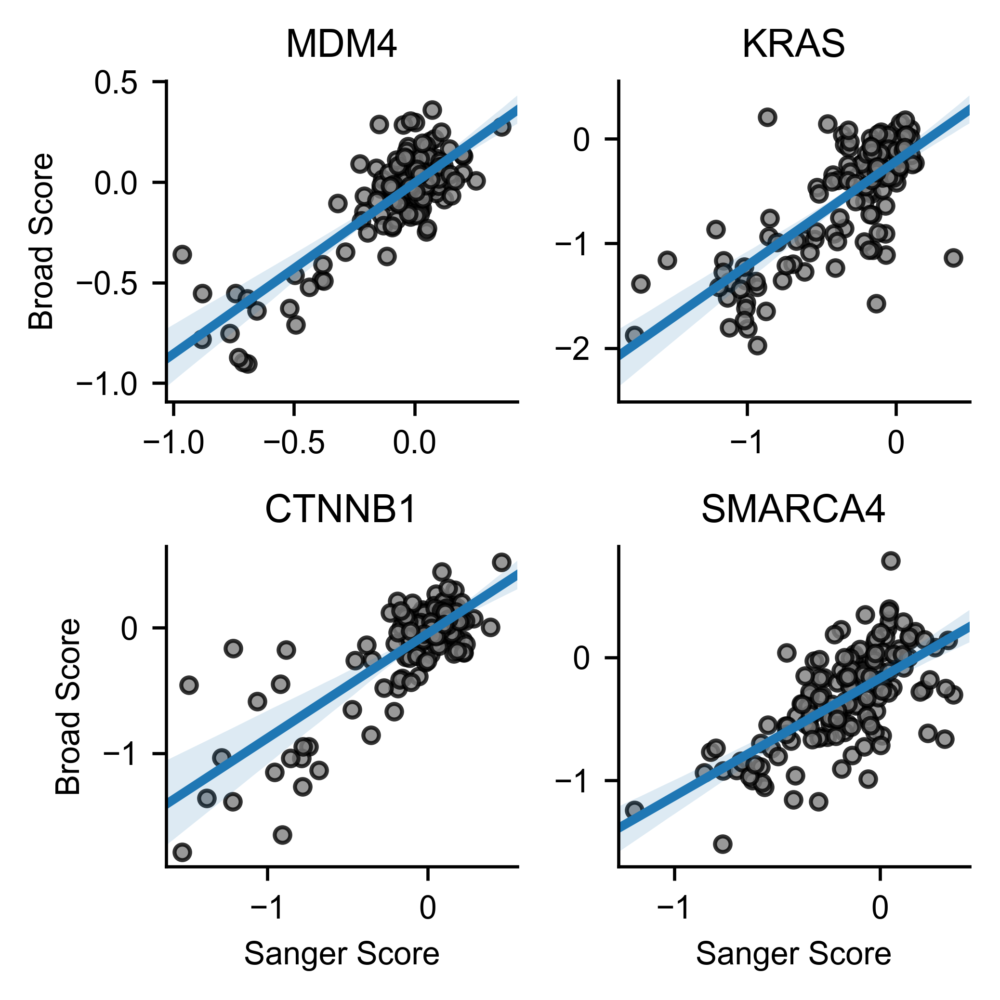

In [50]:
plt.close('all')
example_genes = [
    'MDM4', 'KRAS', 'CTNNB1', 'SMARCA4', 
]
_, axs = plt.subplots(2, 2, figsize=(3.5, 3.5))
axs = [s for t in axs for s in t]
for i, gene in enumerate(example_genes):
    print(gene)
    print("Pearson: %1.4f, %E" % pearsonr(sanger_data['unprocessed'].loc[gene], 
                                          broad_data['unprocessed'].loc[gene]))
    plt.sca(axs[i])
    sns.regplot(sanger_data['unprocessed'].loc[gene], broad_data['unprocessed'].loc[gene], 
                scatter_kws=dict(color='gray', s=15, edgecolor='black'), ax=axs[i]
               )
    simpleaxis()
    plt.xlabel('')
    plt.ylabel('')
    if i%2 == 0:
        plt.ylabel("Broad Score")
    if i //2 == 1:
        plt.xlabel("Sanger Score")
    plt.title(gene)

plt.subplots_adjust(hspace=.35, wspace=.35)
plt.tight_layout()
plt.savefig('FigurePanels/gene_score_examples.png', transparent=True)
plt.savefig('FigurePanels/gene_score_examples.pdf', transparent=True)

## Panel B: Distribution of Gene Profile Correlations

In [51]:
null_corr = []
for i in range(10000):
    s1 = broad_data['unprocessed'].sample(axis=0).iloc[0]
    s2 = sanger_data['unprocessed'].sample(axis=0).iloc[0]
    ind = s1.notnull() & s2.notnull()
    null_corr.append(pearsonr(s1, s2)[0])

In [52]:
corrs_pearson = sanger_data['unprocessed'].corrwith(broad_data['unprocessed'], axis=1)

Median of null: 0.0024776201190887686
Median of all: 0.1867707408701059
Median of SSD: 0.633241270293939
% null > 0.4: 0.0
% all > 0.4: 8.376557562749658
% SSD > 0.4: 83.6734693877551


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


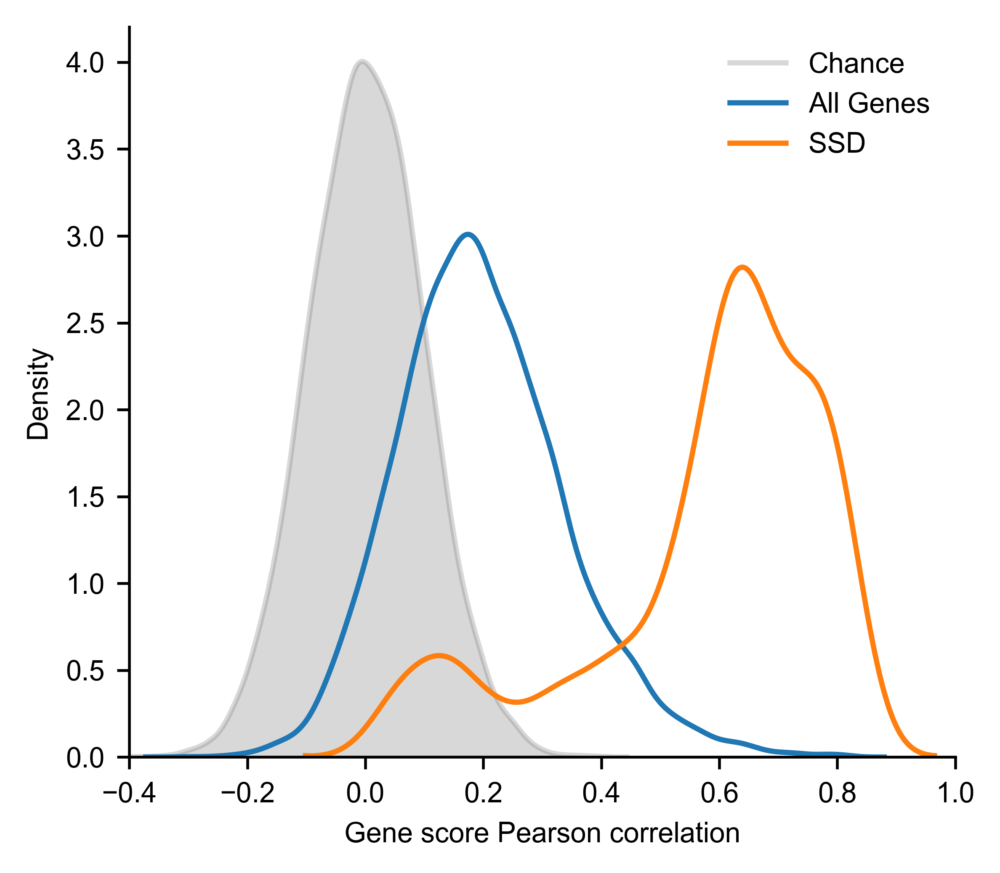

In [53]:
plt.close('all')
plt.figure(figsize=(4.0, 3.5))


print("Median of null:", np.median(null_corr))
print("Median of all:", corrs_pearson.median())
print("Median of SSD:", corrs_pearson[ssds].median())

print("% null > 0.4:", 100*(np.array(null_corr) > 0.4).mean() )
print("% all > 0.4:", 100*(corrs_pearson > 0.4).mean() )
print("% SSD > 0.4:", 100*(corrs_pearson[ssds] > 0.4).mean() )

sns.kdeplot(null_corr, color="gray", alpha=.3, label="Chance", shade=True, gridsize=1000)
sns.kdeplot(corrs_pearson, bw=.02, label='All Genes', gridsize=1000)
sns.kdeplot(corrs_pearson[ssds], bw=.05, label='SSD', gridsize=1000)
#sns.kdeplot(corrs_pearson[cancergenes], bw=.05, label='Cancer Gene', gridsize=1000)
simpleaxis()
plt.xlim(-.4, 1)
plt.xlabel('Gene score Pearson correlation')
plt.ylabel('Density')
plt.tight_layout()
plt.legend(frameon=False)
plt.savefig('FigurePanels/gene_correlation.png', transparent=True)
plt.savefig('FigurePanels/gene_correlation.pdf', transparent=True)

## Panel C: Agreement on Dependencies of SSDs

In [54]:
fdr_cutoffs = {}
for processing in 'unprocessed', 'processed', 'corrected':
    print('\t', processing)
    null = pd.Series(np.concatenate([
        np.ravel(broad_data[processing].loc[nonessential_genes]),
        np.ravel(sanger_data[processing].loc[nonessential_genes])
    ])).dropna()
    observed = pd.Series(np.concatenate([
        np.ravel(broad_data[processing]),
        np.ravel(sanger_data[processing])
    ])).dropna()
    pvals = left_pvalue(null, observed)
    fdr = fdrcorrection(pvals.values, alpha=0.05)[1]
    fdr_cutoffs[processing] = observed[fdr <= .05].max()

	 unprocessed
	 processed
	 corrected


In [55]:
fdr_cutoffs

{'unprocessed': -1.016694685194327,
 'processed': -0.633281951667,
 'corrected': -0.7651008542793549}

In [56]:
#threshold = -.7 #value to call a gene score a dependency
cohen_kappa = {}
for processing in ["processed", "unprocessed", "corrected"]:
        
    cohen_kappa[processing] = pd.Series({
        gene:
        cohen_kappa_score((broad_data[processing].loc[gene] < fdr_cutoffs[processing]), 
                          (sanger_data[processing].loc[gene] < fdr_cutoffs[processing])
                         ) for gene in broad_data[processing].index
         })

/usr/local/lib/python3.6/site-packages/sklearn/metrics/classification.py:370: RuntimeWarning: invalid value encountered in true_divide
  k = np.sum(w_mat * confusion) / np.sum(w_mat * expected)



 processed
Median Cohen kappa score for all genes: 0.000000
Overall Cohen kappa score for all genes: 0.596627
Median Cohen kappa score for SSD genes: 0.461538
Overall Cohen kappa score for SSD genes: 0.369403
N SSDs with Cohen's Kappa > 0.4: 20
scores in both: 89 
null in both: 6829 
scores only Sanger: 25 
scores only Broad: 260 

Fisher's exact: 8.990843 1.95e-43
N: 7203
scores in Sanger if scores in Broad: 0.208176 
scores in Broad if scores in Sanger: 0.793590
taking Sanger as true, Broad Recall = 0.781, Precision = 0.255


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval



 unprocessed
Median Cohen kappa score for all genes: 0.000000
Overall Cohen kappa score for all genes: 0.446243
Median Cohen kappa score for SSD genes: 0.609389
Overall Cohen kappa score for SSD genes: 0.372892
N SSDs with Cohen's Kappa > 0.4: 29
scores in both: 86 
null in both: 6845 
scores only Sanger: 25 
scores only Broad: 247 

Fisher's exact: 9.648904 4.44e-44
N: 7203
scores in Sanger if scores in Broad: 0.125543 
scores in Broad if scores in Sanger: 0.739944
taking Sanger as true, Broad Recall = 0.775, Precision = 0.258

 corrected
Median Cohen kappa score for all genes: 0.000000
Overall Cohen kappa score for all genes: 0.691805
Median Cohen kappa score for SSD genes: 0.758621
Overall Cohen kappa score for SSD genes: 0.645814
N SSDs with Cohen's Kappa > 0.4: 37
scores in both: 189 
null in both: 6819 
scores only Sanger: 62 
scores only Broad: 133 

Fisher's exact: 72.858330 5.29e-194
N: 7203
scores in Sanger if scores in Broad: 0.478619 
scores in Broad if scores in Sanger: 0

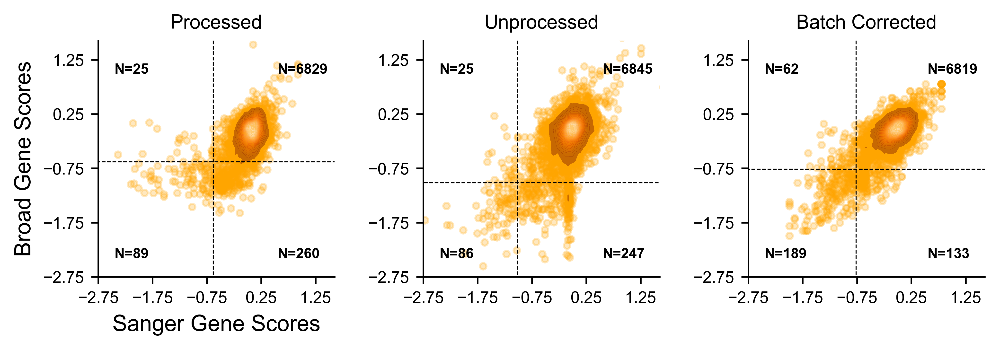

In [57]:
plt.close('all')
fig, axes = plt.subplots(1, 3, figsize=(7.0, 2.3))
for processing, title, ax in zip(
    ["processed", "unprocessed", "corrected"],
    ['Processed', 'Unprocessed', 'Batch Corrected'],
    axes
):

        
    print('\n', processing)
    plt.sca(ax)
    
    print("Median Cohen kappa score for all genes: %f" %cohen_kappa[processing].median())
    print("Overall Cohen kappa score for all genes: %f" %cohen_kappa_score(
                np.ravel(sanger_data[processing] < fdr_cutoffs[processing]),
                np.ravel(broad_data[processing] < fdr_cutoffs[processing]),
    ))
          
    print("Median Cohen kappa score for SSD genes: %f" %cohen_kappa[processing][ssds].median())
    print("Overall Cohen kappa score for SSD genes: %f" %cohen_kappa_score(
                np.ravel(sanger_data[processing].loc[ssds] < fdr_cutoffs[processing]), 
                np.ravel(broad_data[processing].loc[ssds] < fdr_cutoffs[processing]),
    ))
    print("N SSDs with Cohen's Kappa > 0.4: %i" % (cohen_kappa[processing][ssds] > .4).sum())

    below_cut_sanger = sanger_data[processing].loc[ssds] < fdr_cutoffs[processing]
    below_cut_broad = broad_data[processing].loc[ssds] < fdr_cutoffs[processing]
    sdep_bdep = (below_cut_broad & below_cut_sanger).sum().sum()
    snodep_bnodep = (~below_cut_broad & ~below_cut_sanger).sum().sum()
    sdep_bnodep = (~below_cut_broad & below_cut_sanger).sum().sum()
    snodep_bdep = (below_cut_broad & ~below_cut_sanger).sum().sum()
    print(
        'scores in both: %i \nnull in both: %i \nscores only Sanger: %i \nscores only Broad: %i \n' %(
        sdep_bdep,
        snodep_bnodep,
        sdep_bnodep,
        snodep_bdep
    ))
    print("Fisher's exact: %f %1.2e" %(fisher_exact([
            [sdep_bdep, snodep_bdep],
            [snodep_bdep, snodep_bnodep]
        ])))
    print("N:", np.product(sanger_data[processing].loc[ssds].shape))
    print("scores in Sanger if scores in Broad: %f \nscores in Broad if scores in Sanger: %f" %(
        below_cut_sanger[below_cut_broad].mean().mean(),
        below_cut_broad[below_cut_sanger].mean().mean()
    ))
    print("taking Sanger as true, Broad Recall = %1.3f, Precision = %1.3f" % (
        recall_score(y_true=below_cut_sanger.stack().values, y_pred=below_cut_broad.stack().values),
        precision_score(y_true=below_cut_sanger.stack().values, y_pred=below_cut_broad.stack().values),
    ))

    sns.regplot(
        np.ravel(sanger_data[processing].loc[ssds]),
        np.ravel(broad_data[processing].loc[ssds]), 
        scatter_kws=dict(s=10, color='orange', alpha=.25),
        line_kws=dict(color="black"),
        lowess=True,
        fit_reg=False
    )
    sns.kdeplot(
            np.ravel(sanger_data[processing].loc[ssds]),
            np.ravel(broad_data[processing].loc[ssds]), 
            shade=True, shade_lowest=False, cmap='Oranges_r', alpha=.5, n_levels=30,
        )
    plt.plot([-100, 100], 
             [fdr_cutoffs[processing], fdr_cutoffs[processing]], 
             '--', color='black', lw=.5)
    plt.plot( [fdr_cutoffs[processing], fdr_cutoffs[processing]],
             [-100, 100], '--', color='black', lw=.5)

    simpleaxis()
    plt.xlim(-2.7, 1.6)
    plt.ylim(-2.7, 1.6)

    plt.text(.55, 1.0, 'N=%i' %snodep_bnodep, fontsize=7, weight='bold')
    plt.text(.55, -2.4, 'N=%i' %snodep_bdep, fontsize=7, weight='bold')
    plt.text(-2.45, -2.4, 'N=%i' %sdep_bdep, fontsize=7, weight='bold')
    plt.text(-2.45, 1.0, 'N=%i' %sdep_bnodep, fontsize=7, weight='bold')

    #plt.title("Gene Scores Per Cell Line\n(High Signal Genes)", fontsize=16)
    plt.yticks(np.arange(-2.75, 2.25, 1))
    plt.xticks(np.arange(-2.75, 2.25, 1))
    plt.gca().set_aspect('equal')
    plt.title(title)
          
    if processing == 'processed':
        plt.xlabel('Sanger Gene Scores', fontsize=11)
        plt.ylabel('Broad Gene Scores', fontsize=11)
    else:
        plt.xlabel('')
        plt.ylabel('')
        
plt.tight_layout()
plt.savefig('FigurePanels/gene_SSD_scatter.png', transparent=True, dpi=600)
plt.savefig('FigurePanels/gene_SSD_scatter.pdf', transparent=True)

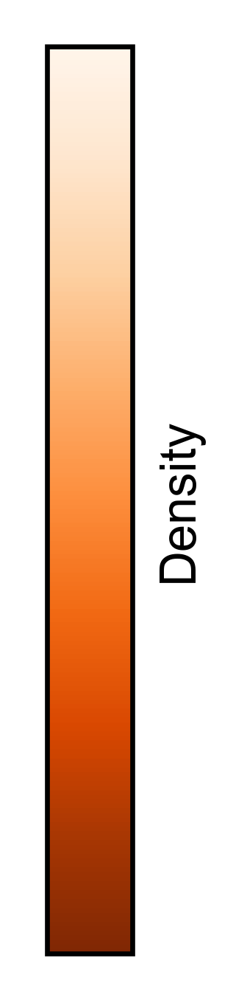

In [58]:
norm = mpl.colors.Normalize(vmin=0, vmax=1)
plt.close('all')
plt.figure(figsize=(.6, 2.3))
cb1 = mpl.colorbar.ColorbarBase(plt.gca(), 
                                cmap=ListedColormap(
                                    sns.color_palette("Oranges_r", n_colors=200)
                                ), ticks=[],
                                norm=norm,
                                orientation='vertical')
cb1.set_label('Density')
plt.tight_layout()
plt.savefig("FigurePanels/scatter_colorbar_orange.png")

In [59]:
scores_broad_not_sanger = {}
for processing in ['unprocessed', 'processed', 'corrected']:
    scores_broad_not_sanger[processing] = pd.Series({gene: (
        (broad_data[processing].loc[gene] <= fdr_cutoffs[processing])
        & (sanger_data[processing].loc[gene] > fdr_cutoffs[processing])
    ).sum() for gene in ssds}).sort_values(ascending=False)

In [60]:
scores_broad_not_sanger['unprocessed'].sum()

247

In [61]:
(scores_broad_not_sanger['unprocessed'] / scores_broad_not_sanger['unprocessed'].sum())[:3]

HSPA5    0.534413
MDM2     0.072874
IRS2     0.032389
dtype: float64

In [62]:
(scores_broad_not_sanger['processed'] / scores_broad_not_sanger['processed'].sum())[:3]

HSPA5     0.476923
DDX19A    0.111538
MDM2      0.053846
dtype: float64

In [63]:
(scores_broad_not_sanger['corrected'] / scores_broad_not_sanger['processed'].sum())[:3]

HSPA5    0.223077
MDM2     0.030769
ERBB2    0.030769
dtype: float64

In [64]:
broad_essential.loc['HSPA5']

True

## Supp 1D: Cohen's Kappa Distribution

In [65]:
null_cohen = []
for i in range(10000):
    s1 = broad_data['unprocessed'].sample(axis=0).iloc[0]
    s2 = sanger_data['unprocessed'].sample(axis=0).iloc[0]
    ind = s1.notnull() & s2.notnull()
    null_cohen.append(cohen_kappa_score((s1[ind] < fdr_cutoffs['unprocessed']),
                                        (s2[ind] < fdr_cutoffs['unprocessed'])))

/usr/local/lib/python3.6/site-packages/sklearn/metrics/classification.py:370: RuntimeWarning: invalid value encountered in true_divide
  k = np.sum(w_mat * confusion) / np.sum(w_mat * expected)


/usr/local/lib/python3.6/site-packages/numpy/lib/function_base.py:3405: RuntimeWarning: Invalid value encountered in median
  r = func(a, **kwargs)
/Users/dempster/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/usr/local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


Median of null: nan
Median of all: 0.0
Median of SSD: 0.6093888396811338
SSDs with kappa > 0.4: 0.5918
Null with kappa > 0.4: 0.0002


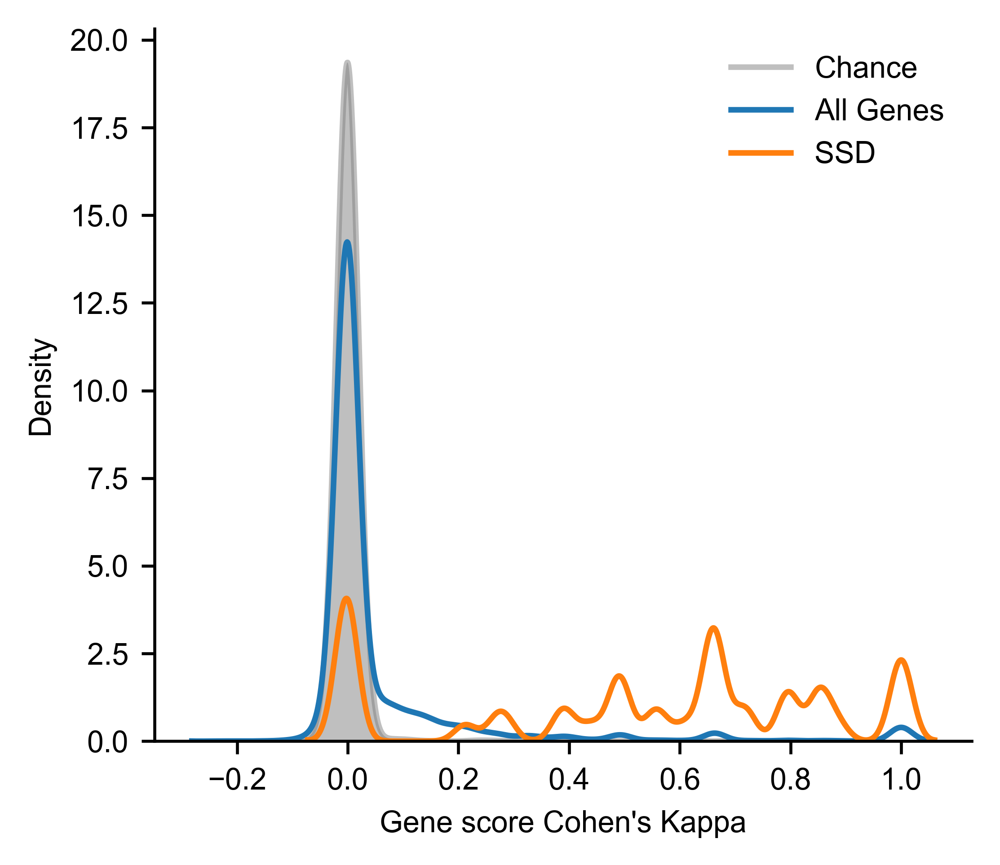

In [66]:
plt.close('all')
plt.figure(figsize=(3.75, 3.25))

print("Median of null:", np.median(null_cohen))
print("Median of all:", cohen_kappa['unprocessed'].median())
print("Median of SSD:", cohen_kappa['unprocessed'][ssds].median())
print('SSDs with kappa > 0.4: %1.4f' % (cohen_kappa['unprocessed'][ssds] > .4).mean())
print('Null with kappa > 0.4: %1.4f' % (np.array(null_cohen) > .4).mean())

sns.kdeplot(null_cohen, bw=.02, label='Chance', color='gray', alpha=.5, shade=True, gridsize=1000)
sns.kdeplot(cohen_kappa['unprocessed'], bw=.02, label='All Genes', gridsize=1000)
sns.kdeplot(cohen_kappa['unprocessed'][ssds], bw=.02, label='SSD', gridsize=1000)
#sns.kdeplot(cohen_kappa['unprocessed'][cancergenes], bw=.05, label='Cancer Gene', gridsize=1000)
simpleaxis()
#plt.xlim(-.15, 1)
plt.xlabel("Gene score Cohen's Kappa")
plt.ylabel('Density')
plt.tight_layout()
plt.legend(frameon=False)
plt.savefig('FigurePanels/gene_cohen_kappa.png', dpi=600, transparent=True)
plt.savefig('FigurePanels/gene_cohen_kappa.pdf', transparent=True)

## Supp 1C: Recovery of SSD Dependencies


 processed
AUC for getting Sanger dependency from Broad depletion: 0.939870
AUROC for getting Broad dependency from Sanger depletion: 0.918161

 unprocessed
AUC for getting Sanger dependency from Broad depletion: 0.962986
AUROC for getting Broad dependency from Sanger depletion: 0.869717

 corrected
AUC for getting Sanger dependency from Broad depletion: 0.971453
AUROC for getting Broad dependency from Sanger depletion: 0.967736


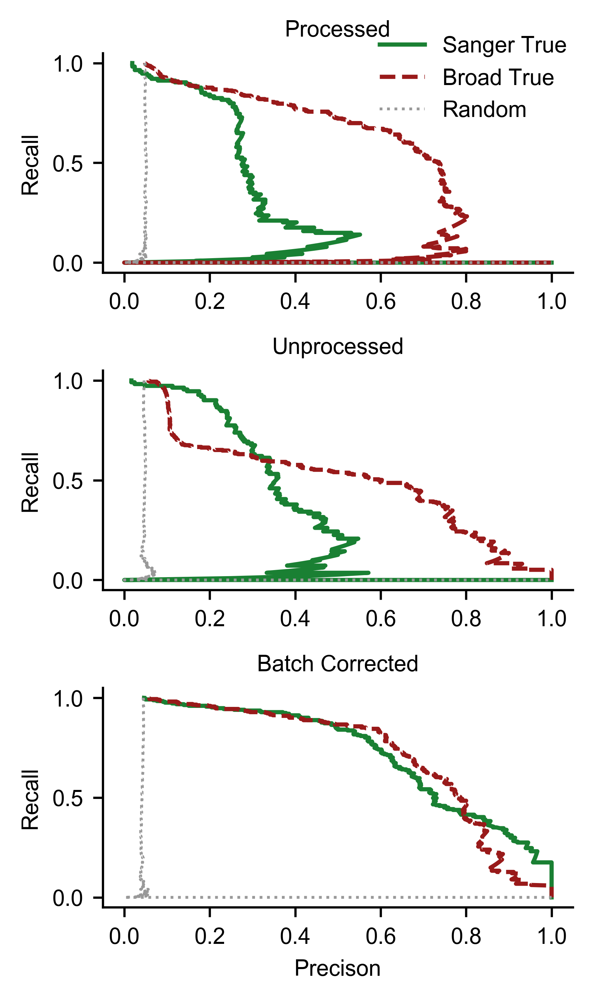

In [67]:
plt.close('all')
fig, axes = plt.subplots(3, 1, figsize=(3, 5))
for processing, title, ax in zip(
    ["processed", "unprocessed", "corrected"],
    ['Processed', 'Unprocessed', 'Batch Corrected'],
    axes
):

    print('\n', processing)
    plt.sca(ax)

    precision, recall, thresholds = precision_recall_curve(
        y_true=np.ravel(sanger_data[processing].loc[ssds] < fdr_cutoffs[processing]).astype(np.int),
        probas_pred=-np.ravel(broad_data[processing].loc[ssds])                      
    )
    plt.plot(precision, recall, label="Sanger True", color=[.1, .5, .2])
    print('AUC for getting Sanger dependency from Broad depletion: %f' % roc_auc_score(
        y_true=np.ravel(sanger_data[processing].loc[ssds] < fdr_cutoffs[processing]).astype(np.int),
        y_score=-np.ravel(broad_data[processing].loc[ssds])
    ))

    precision, recall, thresholds = precision_recall_curve(
        y_true=np.ravel(broad_data[processing].loc[ssds] < fdr_cutoffs[processing]).astype(np.int),
        probas_pred=-np.ravel(sanger_data[processing].loc[ssds])                      
    )
    print('AUROC for getting Broad dependency from Sanger depletion: %f' % roc_auc_score(
        y_true=np.ravel(broad_data[processing].loc[ssds] < fdr_cutoffs[processing]).astype(np.int),
        y_score=-np.ravel(sanger_data[processing].loc[ssds])
    ))
    plt.plot(precision, recall, '--', label="Broad True", color=[.6, .1, .1])
    
    precision, recall, thresholds = precision_recall_curve(
        y_true=np.random.choice(
            np.ravel(broad_data[processing].loc[ssds] < fdr_cutoffs[processing]).astype(np.int),
            size = broad_data[processing].shape[1] * len(ssds), 
            replace=False
        ),
        probas_pred=-np.ravel(sanger_data[processing].loc[ssds])                      
    )
    plt.plot(precision, recall, ':', label="Random", color=[.6, .6, .6], lw=1)
    #plt.plot([0, 1], [0, 1], '--', color='black', lw=.5)

    if processing == 'processed':
        plt.legend(frameon=False, loc=(.57, .65))
        
    plt.ylabel("Recall")
    if processing == 'corrected':
        plt.xlabel("Precison")
        
    else:
        plt.xlabel("")
    simpleaxis()
    plt.title(title, fontsize=8)
    
plt.tight_layout()
plt.savefig("FigurePanels/SSD_PR_curve.png", transparent=True)

# Fig 4: Library Explanations of Screen Differences

## Panel A: sgRNA correlation vs NormLRT score

In [68]:
# Code below produced the imported table. Uncomment to run (expect it to take some time)

# gene_mean_corrs = pd.DataFrame(columns=['Sanger', 'Broad', 'Within', 'Between'])
# for i, gene in enumerate(broad_data['unprocessed'].index):
#     if not i%1000:
#         print(i *1./len(broad_data['unprocessed']))
#     guides_avana = guide_map_avana.index[guide_map_avana.gene == gene]
#     guides_ky = guide_map_ky.index[guide_map_ky.gene == gene]
#     bb = covar(broad_data['lfc_cell'].loc[guides_avana].T)
#     ss = covar(sanger_data['lfc_cell'].loc[guides_ky].T)
#     np.fill_diagonal(bb.values, np.nan)
#     np.fill_diagonal(ss.values, np.nan)
#     bs = covar(broad_data['lfc_cell'].loc[guides_avana].T, sanger_data['lfc_cell'].loc[guides_ky].T)

#     gene_mean_corrs.loc[gene] = {
#         'Sanger': ss.mean().mean(),
#         'Broad': bb.mean().mean(),
#         'Within': .5*(bb.mean().mean() + ss.mean().mean()),
#         'Between': bs.mean().mean()
#     }

# gene_mean_corrs.index.name = 'gene'

# gene_mean_corrs.to_csv("SupplementaryTables/MeansgRNACorrelation.csv")
gene_mean_corrs = pd.read_csv("SupplementaryTables/MeansgRNACorrelation.csv", index_col=0)

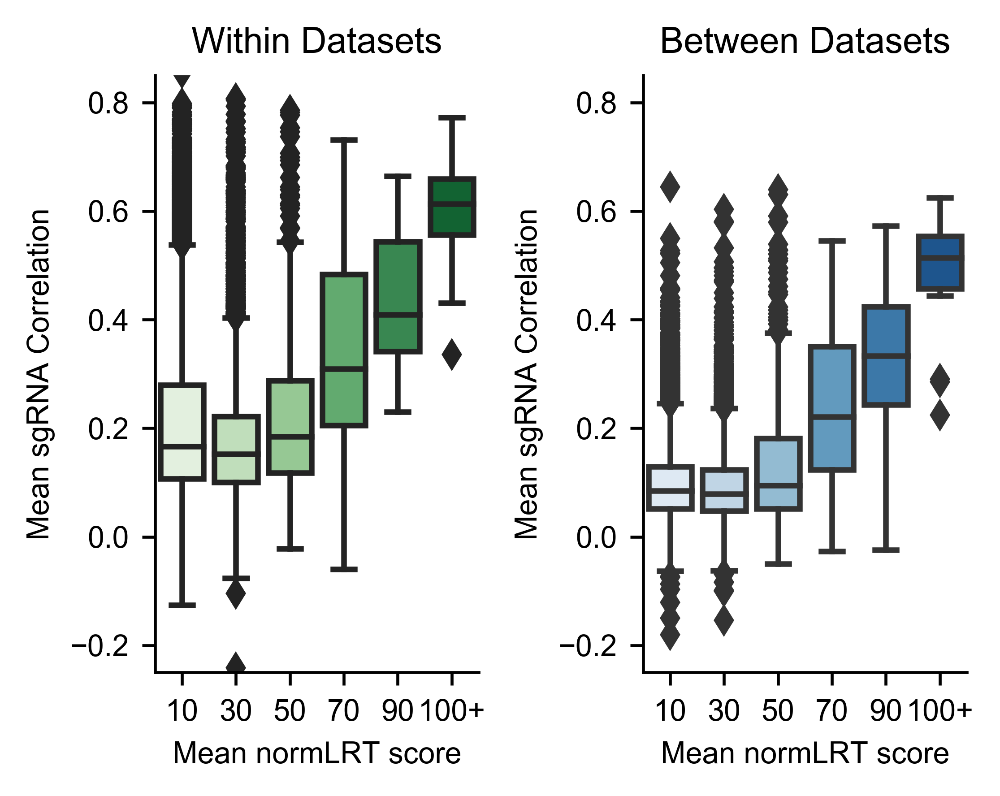

In [69]:
plt.close('all')
_, axs = plt.subplots(1, 2, figsize=(3.75, 3.0))

plt.sca(axs[0])
df = pd.DataFrame({"Mean sgRNA Correlation": gene_mean_corrs['Within'],
                   "Mean normLRT Score": .5 * (
                       np.clip(sanger_data['normLRT'], 0, np.inf) + 
                       np.clip(broad_data['normLRT'], 0, np.inf)
                   )
                  })
df.dropna(how='any', inplace=True)
bins = np.array([0,  20,  40,  60, 80, 100])
medians = np.concatenate([(.5*(bins[1:] + bins[:-1])).astype(np.int).astype(str), ["100+"]])
df['bins'] = np.digitize(df['Mean normLRT Score'], bins)
sns.boxplot(data=df, x='bins', y='Mean sgRNA Correlation', palette='Greens')
plt.xticks(range(len(bins)), medians)
simpleaxis()
plt.xlabel("Mean normLRT score")
plt.title('Within Datasets')
plt.ylim(-.25, .85)

plt.sca(axs[1])
df = pd.DataFrame({"Mean sgRNA Correlation": gene_mean_corrs['Between'],
                   "Mean normLRT Score": .5 * (
                       np.clip(sanger_data['normLRT'], 0, np.inf) + 
                       np.clip(broad_data['normLRT'], 0, np.inf)
                   )
                  })
df.dropna(how='any', inplace=True)
bins = np.array([0, 20, 40, 60, 80, 100])
medians = np.concatenate([(.5*(bins[1:] + bins[:-1])).astype(np.int).astype(str), ["100+"]])
df['bins'] = np.digitize(df['Mean normLRT Score'], bins)
sns.boxplot(data=df, x='bins', y='Mean sgRNA Correlation', palette='Blues')
plt.xticks(range(len(bins)), medians)
simpleaxis()
plt.xlabel("Mean normLRT score")
plt.title('Between Datasets')
plt.ylim(-.25, .85)

plt.tight_layout()
plt.savefig('FigurePanels/lrt_correlation.png', transparent=True)
plt.savefig('FigurePanels/lrt_correlation.pdf', transparent=True)

## Panel B: Gene Correlation and Guide Correlation

In [70]:
bad_ssds = corrs_pearson[ssds][corrs_pearson[ssds] < .2].index

/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Pearson correlation of mean guide correlation to institute gene score correlation for SSDs:
r: 0.752, p: 4.807393E-10 N: 49


/usr/local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: Series.nonzero() is deprecated and will be removed in a future version.Use Series.to_numpy().nonzero() instead
  return getattr(obj, method)(*args, **kwds)


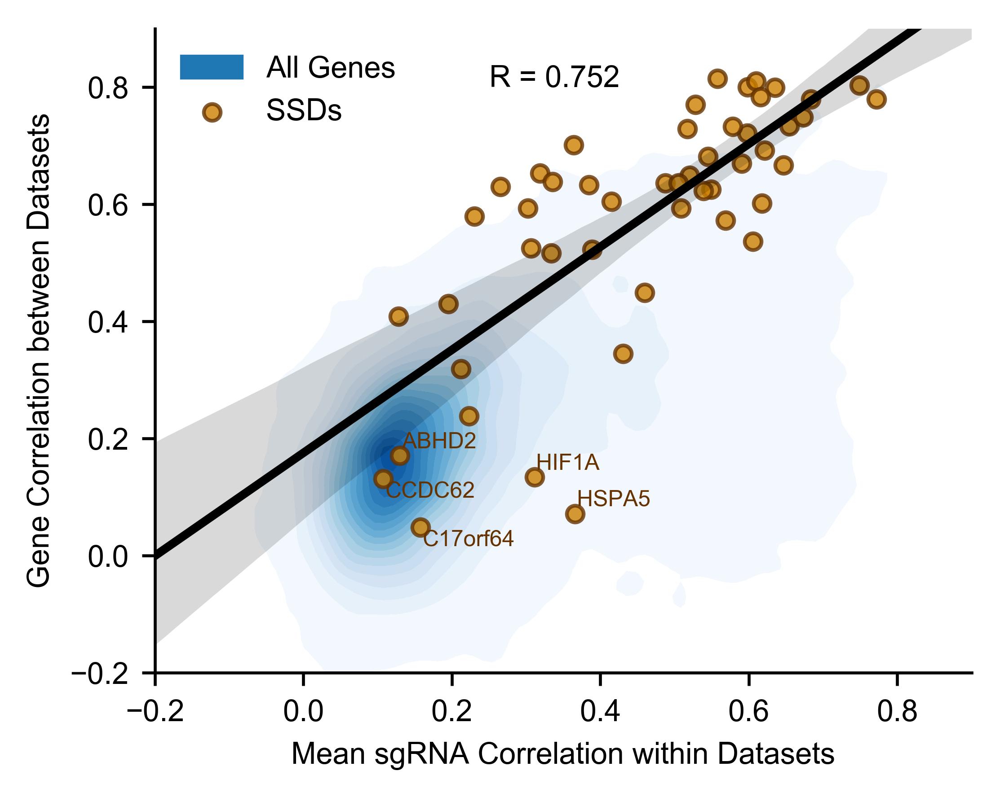

In [71]:
plt.figure(figsize=(3.75, 3.0))

mask = gene_mean_corrs['Within'].notnull()
sns.kdeplot(
    gene_mean_corrs['Within'][mask], 
    sanger_data['unprocessed'].T.corrwith(broad_data['unprocessed'].T).loc[gene_mean_corrs.index[mask]],
    cmap="Blues", levels=np.arange(.1, 20, 1),
    shade=True, shade_lowest=True, label="All Genes"
)

x = gene_mean_corrs['Within'].loc[ssds]
y = sanger_data['unprocessed'].T.corrwith(broad_data['unprocessed'].T).loc[ssds]
mask = x.notnull() & y.notnull()
r, p = pearsonr(x[mask], y[mask])
print("Pearson correlation of mean guide correlation to institute gene score correlation for SSDs:")
print('r: %1.3f, p: %E N: %i' % (r, p, mask.sum()))

sns.regplot(
    x[mask], 
    y[mask],
    lowess=False, label="SSDs", 
    line_kws=dict(color='black'),
    scatter_kws=dict(s=20, linewidth=1, edgecolor=[.4, .2, 0], color=[.8, .5, 0])
)

plt.text(s="R = %1.3f" % r, x=.25, y=.8)
texts = [plt.text(s=ind, x=x[ind], y=y[ind], fontsize=6, color=[.4, .2, 0]) for ind in bad_ssds]
adjust_text(texts, x=x, y=y)
simpleaxis()

plt.xlabel("Mean sgRNA Correlation within Datasets")
plt.ylabel("Gene Correlation between Datasets")
plt.xlim(-.2, .9)
plt.ylim(-.2, .9)
plt.legend(frameon=False)
plt.tight_layout()
plt.savefig("FigurePanels/gene_correlations_vs_guide_correlations.png", transparent=True)
plt.savefig("FigurePanels/gene_correlations_vs_guide_correlations.pdf", transparent=True)

## Panel C: Relationship of Gene Depletion and Independently Estimated Guide Efficacy

/Users/dempster/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:11: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  # This is added back by InteractiveShellApp.init_path()


Broad correlation: -0.282827, 9.408558e-103


/Users/dempster/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:42: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


Sanger correlation: -0.166509, 1.480455e-47


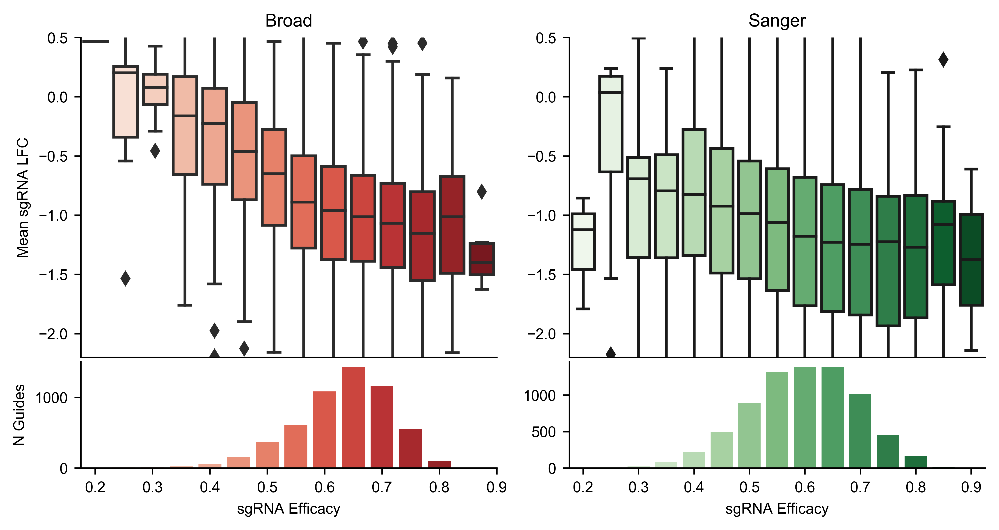

In [72]:
plt.close('all')
_, axs = plt.subplots(2, 2, figsize=(7.5, 4), gridspec_kw = {'height_ratios':[3, 1]})
genes_interest = set(broad_ess) | set(sanger_ess)

plt.sca(axs[0, 0])

df = pd.DataFrame({
    "Guide Efficacy": np.round(20*guide_map_avana['efficacy'].dropna()).astype(np.int),
    "Mean Guide LFC": broad_data['lfc'].mean(axis=1).loc[guide_map_avana.efficacy.dropna().index] 
                  })
df = df.loc[guide_map_avana.index[guide_map_avana.gene.isin(genes_interest)]]
df.dropna(how='any', inplace=True)
print("Broad correlation: %f, %e" % pearsonr(df['Guide Efficacy'], df['Mean Guide LFC']))

bins = np.arange(min(df['Guide Efficacy']) -.5, max(df['Guide Efficacy']) + .5)
medians = list((.5*(bins[1:] + bins[:-1]))/20)
medians.extend((medians[-1] + 1./20, medians[-1] + 2./20))
df['bins'] = np.digitize(df['Guide Efficacy'], bins)
sns.boxplot(data=df, x='bins', y='Mean Guide LFC', palette='Reds')
plt.xticks([])
simpleaxis()
plt.ylim(-2.2, .5)
plt.ylabel("Mean sgRNA LFC")
plt.xlabel('')
plt.title('Broad')

plt.sca(axs[1, 0])
sns.countplot(x=df.bins.sort_values(), palette='Reds')
simpleaxis()
plt.ylabel("N Guides")
plt.xlabel("sgRNA Efficacy")
plt.xticks(range(0, len(bins)+2, 2), medians[0::2])

plt.sca(axs[0, 1])
df = pd.DataFrame({"Guide Efficacy": (
    np.round(20*guide_map_ky['efficacy'].dropna())
).astype(np.int),
                   "Mean Guide LFC": 
                   sanger_data['lfc'].mean(axis=1).loc[guide_map_ky.efficacy.dropna().index]
                  })

df = df.loc[guide_map_ky.index[guide_map_ky.gene.isin(genes_interest)]]
df.dropna(how='any', inplace=True)
print("Sanger correlation: %f, %e" % pearsonr(df['Guide Efficacy'], df['Mean Guide LFC']))

#bins = np.arange(min(df['Guide Efficacy']) -.5, max(df['Guide Efficacy']) + .5)
medians = list((.5*(bins[1:] + bins[:-1]))/20)
medians.extend((medians[-1] + 1./20, medians[-1] + 2./20))
medians = np.round(medians, 2)
df['bins'] = np.digitize(df['Guide Efficacy'], bins)
sns.boxplot(data=df, x='bins', y='Mean Guide LFC', palette='Greens')
plt.xticks(range(0, len(bins)+2, 2), medians[0::2])
simpleaxis()
plt.ylim(-2.2, .5)
plt.ylabel("")
plt.xlabel("")
plt.xticks([])
plt.title('Sanger')

plt.sca(axs[1, 1])
sns.countplot(x=df.bins.sort_values(), palette='Greens')
simpleaxis()
plt.ylabel("")
plt.xlabel("sgRNA Efficacy")
plt.xticks(range(0, len(bins)+2, 2), medians[0::2])

plt.tight_layout()
plt.subplots_adjust(hspace=.02)
plt.savefig('FigurePanels/guide_eff_bar.png', transparent=True)
plt.savefig('FigurePanels/guide_eff_bar.pdf', transparent=True)

## Panel D: Example SSDs of Different Efficacies

In [73]:
efficacy_median_avana = guide_map_avana.groupby('gene')['efficacy'].median()
efficacy_median_ky = guide_map_ky.groupby('gene')['efficacy'].median()
eff_min = np.minimum(efficacy_median_avana[ssds], efficacy_median_ky[ssds]).sort_values().dropna()
eff_diff = (efficacy_median_avana - efficacy_median_ky).sort_values().dropna()

best_guides = eff_min.index[-1]
second_best_guides = eff_min.index[-2]
ky_bad = efficacy_median_ky[ssds].sort_values().index[0]
avana_bad = eff_diff[sorted(set(broad_ess) | set(sanger_ess))].dropna().sort_values().index[0]

/usr/local/lib/python3.6/site-packages/pandas/core/series.py:951: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


Gene: TFAP2C  Avana Median Guide Efficacy: 0.654, KY Median Guide Efficacy: 0.633
Gene: EIF3F  Avana Median Guide Efficacy: 0.398, KY Median Guide Efficacy: 0.613
Gene: MDM2  Avana Median Guide Efficacy: 0.585, KY Median Guide Efficacy: 0.402


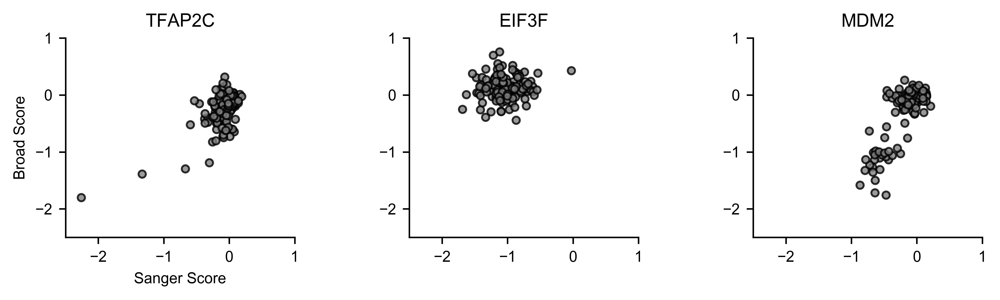

In [74]:
plt.close('all')
fig, axs = plt.subplots(1, 3, figsize=(7.5, 2.25))
for ax, gene in zip(axs, [best_guides, avana_bad, ky_bad]):
    print("Gene: %s  Avana Median Guide Efficacy: %1.3f, KY Median Guide Efficacy: %1.3f" %(
        gene, efficacy_median_avana[gene], efficacy_median_ky[gene]
    ))
    plt.sca(ax)
    sns.regplot(sanger_data['unprocessed'].loc[gene], broad_data['unprocessed'].loc[gene], 
                scatter_kws=dict(color='gray', s=15, edgecolor='black'), fit_reg=False
               )
    simpleaxis()
    #maxmax = max(ax.get_xlim()[1], ax.get_ylim()[1])
    #minmin = min(ax.get_xlim()[0], ax.get_ylim()[0])
    plt.xlim(-2.5, 1)
    plt.ylim(-2.5, 1)
    plt.xlabel('')
    plt.ylabel('')
    if gene == best_guides:
        plt.ylabel("Broad Score")
        plt.xlabel("Sanger Score")
    plt.title(gene)
plt.tight_layout()
plt.subplots_adjust(wspace=.5)
plt.savefig("FigurePanels/guide_efficacy_ssd_examples.png", transparent=True)
plt.savefig("FigurePanels/guide_efficacy_ssd_examples.pdf", transparent=True)

# Fig 5: Timepoint Explanations of Screen Differences

## Panel A: Comparison of Late and Early Essentials

                          Mean Score
Dataset Category                    
Broad   Early Essentials   -0.829717
        Late Essentials    -0.402047
Sanger  Early Essentials   -0.781415
        Late Essentials    -0.268936


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


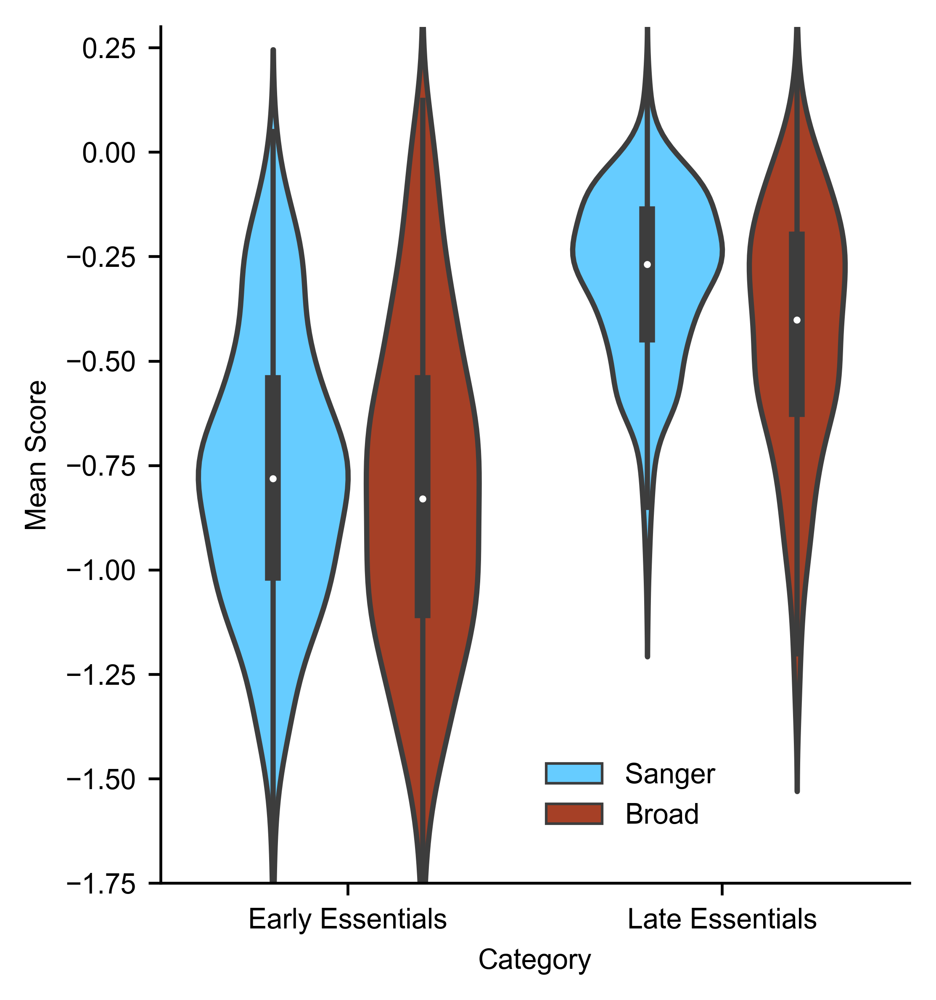

In [75]:
plt.close('all')
plt.figure(figsize=(3.75, 4.0))
df = pd.DataFrame(columns=['Dataset', 'Category', 'Mean Score'])
for name, dataset in zip(['Sanger', 'Broad'], [sanger_data["unprocessed"], broad_data["unprocessed"]]):
    for category, genes in zip(['Early Essentials', 'Late Essentials'], [early_essentials, late_essentials]):
        df = df.append(pd.DataFrame({'Dataset': name, 
                                     'Category': category, 
                                     'Mean Score': dataset.loc[genes].mean(axis=1)
                                    }),
                      ignore_index=True)
        
print(df.groupby(['Dataset', 'Category']).median())

sns.violinplot(data=df, hue='Dataset', x='Category', y='Mean Score', saturation=1,
               palette=sns.color_palette([[.4, .8, 1, 1], [.65, .25, .15, 1]]),
               legend=None
              )
simpleaxis()
plt.ylim(-1.75, .3)
plt.tight_layout()
plt.legend(loc=(.5, .05), frameon=False)
plt.savefig("FigurePanels/essential_categories_violin.png", dpi=600)

Normal test for differences of medians of means for random gene sets between Broad and Sanger:
Statistic: 1.235136, p-value 0.539254
P-value that the difference in medians seen for late essentials would be observed for a random set of essentials: 1.936221E-76


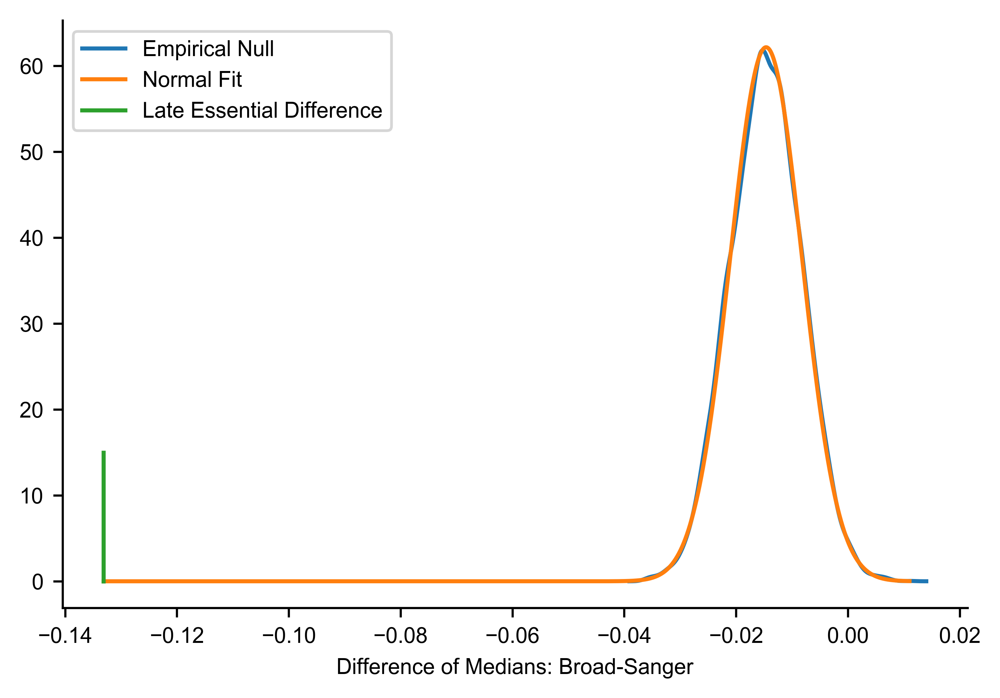

In [80]:
# permutation testing to generate the null that a random set of genes would have the median of means be as different
# as the late essentials are:
n = len(late_essentials)
means_broad = broad_data['unprocessed'].mean(axis=1)
means_sanger = sanger_data['unprocessed'].mean(axis=1)
late_diff = means_broad[late_essentials].median() - means_sanger[late_essentials].median()

genes_interest = means_broad.index
medians = []
for i in range(10000):
    genes = np.random.choice(genes_interest, size=n, replace=True)
    medians.append(means_broad.loc[genes].median() - means_sanger.loc[genes].median())
    

print("Normal test for differences of medians of means for random gene sets between Broad and Sanger:")
print("Statistic: %f, p-value %f" %normaltest(medians))
loc, scale = normaldist.fit(medians)
sns.kdeplot(medians, bw=.001, gridsize=1000, label="Empirical Null")
x = np.linspace(min(min(medians), late_diff), max(max(medians), late_diff), 1000)
plt.plot(x, normaldist.pdf(x, loc=loc, scale=scale), label="Normal Fit")
plt.plot([late_diff, late_diff], [0, 15], label="Late Essential Difference")
plt.legend()
plt.xlabel("Difference of Medians: Broad-Sanger")
simpleaxis()

print(
    "P-value that the difference in medians seen for late essentials\
 would be observed for a random set of essentials: %E" % 
      normaldist.cdf(late_diff, loc=loc, scale=scale
      )
)

## Media and ASNS Dependency

In [81]:
cell_conditions = {institute: {media: screen_media[institute].loc[lambda x: x==media].index
                               for media in ['DMEM', 'RPMI', 'DMEM:F12']
                              }
                   for institute in ['Broad', 'Sanger']
                  }

In [82]:

media_significance = pd.DataFrame({
    'Broad_RPMI_DMEM': 
      broad_data['corrected'].apply(lambda x: 
                                      ttest_ind(x[cell_conditions['Broad']['RPMI']],
                                                x[cell_conditions['Broad']['DMEM']]
                                               )[1], axis=1
                                     ),
    'Broad_RPMI_DMEMF12': 
      broad_data['corrected'].apply(lambda x: 
                                      ttest_ind(x[cell_conditions['Broad']['RPMI']],
                                                x[cell_conditions['Broad']['DMEM:F12']]
                                               )[1], axis=1
                                     ),
    'Broad_DMEM_DMEMF12': 
      broad_data['corrected'].apply(lambda x: 
                                      ttest_ind(x[cell_conditions['Broad']['DMEM']],
                                                x[cell_conditions['Broad']['DMEM:F12']]
                                               )[1], axis=1
                                     ),
    'Sanger_RPMI_DMEMF12': 
      sanger_data['corrected'].apply(lambda x: 
                                      ttest_ind(x[cell_conditions['Sanger']['RPMI']],
                                                x[cell_conditions['Sanger']['DMEM:F12']]
                                               )[1], axis=1
                                     )
})

In [83]:
media_fdr = pd.DataFrame({col: fdrcorrection(media_significance[col], .25)[1]
                          for col in media_significance
                         }, index=media_significance.index)

In [84]:
media_significance.loc['ASNS']

Broad_RPMI_DMEM        1.520057e-10
Broad_RPMI_DMEMF12     9.606205e-01
Broad_DMEM_DMEMF12     1.735297e-02
Sanger_RPMI_DMEMF12    9.635607e-01
Name: ASNS, dtype: float64

In [85]:
print({key1: {key2: len(val2) for key2, val2 in val1.items()} for key1, val1 in cell_conditions.items()})

{'Broad': {'DMEM': 27, 'RPMI': 73, 'DMEM:F12': 7}, 'Sanger': {'DMEM': 0, 'RPMI': 73, 'DMEM:F12': 74}}


ASNS
Institute  Media   
Broad      DMEM       -0.376908
           DMEM:F12    0.049766
           RPMI        0.018241
Sanger     DMEM:F12   -0.041985
           RPMI       -0.045792
Name: Score, dtype: float64
Institute  Media   
Broad      DMEM        5.0
           DMEM:F12    0.0
           RPMI        0.0
Sanger     DMEM:F12    2.0
           RPMI        3.0
Name: Score, dtype: float64


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


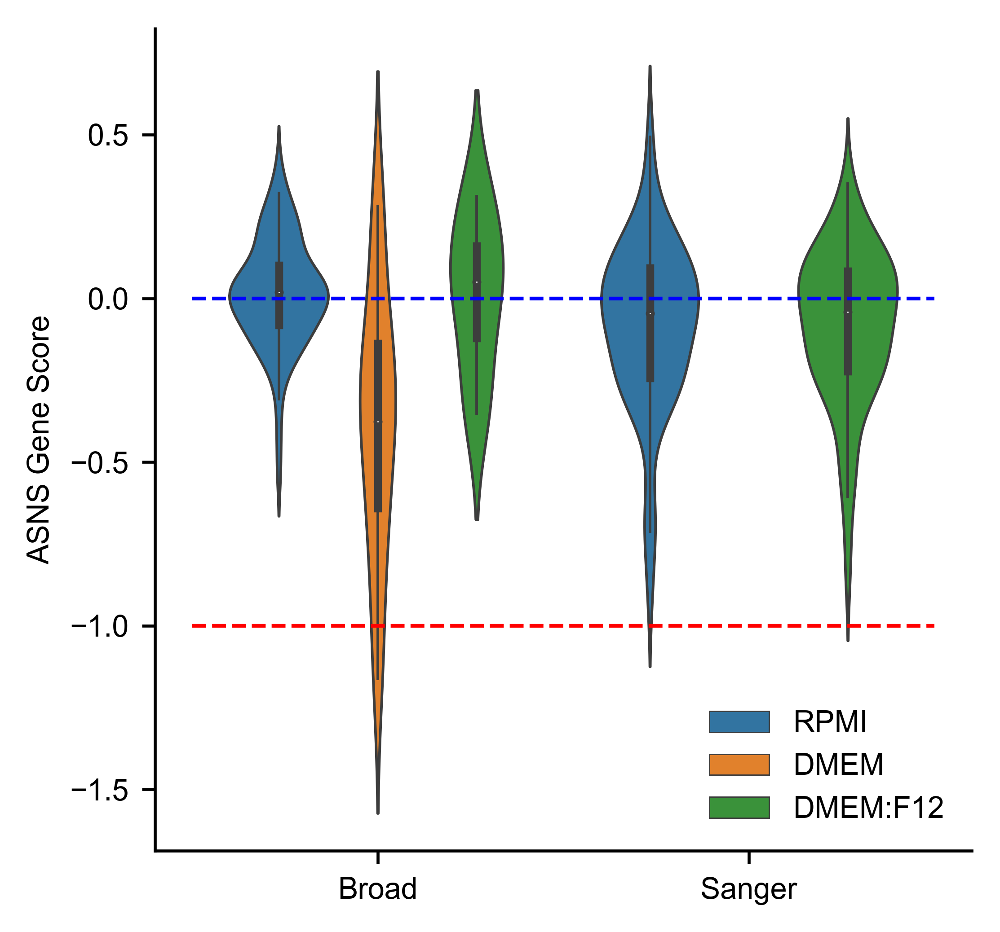

In [86]:

plt.close('all')
fig, axs = plt.subplots(1, 1, figsize=(3.75, 3.5))

gene = 'ASNS'
    
df = pd.concat([
    pd.DataFrame({'Institute': 'Broad', 'Media': 'RPMI', 'Score': broad_data['corrected'].loc[
            gene, cell_conditions['Broad']['RPMI']
    ] }),
    pd.DataFrame({'Institute': 'Broad', 'Media': 'DMEM', 'Score': broad_data['corrected'].loc[
            gene, cell_conditions['Broad']['DMEM']
    ] }),
    pd.DataFrame({'Institute': 'Broad', 'Media': 'DMEM:F12', 'Score': broad_data['corrected'].loc[
            gene, cell_conditions['Broad']['DMEM:F12']
    ] }),
    pd.DataFrame({'Institute': 'Sanger', 'Media': 'RPMI', 'Score': sanger_data['corrected'].loc[
            gene, cell_conditions['Sanger']['RPMI']
    ] }),
    pd.DataFrame({'Institute': 'Sanger', 'Media': 'DMEM:F12', 'Score': sanger_data['corrected'].loc[
            gene, cell_conditions['Sanger']['DMEM:F12']
    ] }),
], ignore_index=True)

print(gene)
print(df.groupby(['Institute', 'Media'])['Score'].median())
print(df.groupby(['Institute', 'Media'])['Score'].agg(lambda x: (x <= -.7).sum() ))
sns.violinplot(data=df, x='Institute', hue='Media', y='Score', linewidth=.7)
if gene == 'ASNS':
    plt.legend(loc='lower right', frameon=False)
else:
    ax.get_legend().remove()
simpleaxis()
plt.ylabel("%s Gene Score" % gene)
plt.xlabel("")
plt.plot([-.5, 1.5], [0, 0], '--', color='blue', lw=1)
plt.plot([-.5, 1.5], [-1, -1], '--', color='red', lw=1)
    
plt.tight_layout()
plt.savefig("FigurePanels/metabolic_examples.png", dpi=600)

# Fig 6: Replication Efforts

## Panel A: PCA of Screens Including Replication

In [87]:
concatenated = broad_data['unprocessed'].copy()
concatenated.columns = [s + '_AvanaD21_Broad' for s in concatenated.columns]

sang_temp = sanger_data['unprocessed'].copy()
sang_temp.columns = [s + '_KYD14_Sanger' for s in sang_temp.columns]
concatenated = concatenated.join(
    sang_temp
).join(
    broad_data['alternateTP']
).join(
    broad_data['alternateLib']
#).join(
#    broad_data['alternateSeq']
# ).join(
#     broad_data['alternateLibSeq']
).join(
    sanger_data['alternateTP']
).join(
    sanger_data['alternateLine']
).join(
    sanger_data['alternateLib']
).join(
    sanger_data['alternateLibLine']
)

In [88]:
concatenated.dropna(how='any', axis=0, inplace=True)

In [89]:
pca = PCA(2)
comps = pd.DataFrame(pca.fit_transform(concatenated.T)[:, :2], index=concatenated.columns, columns=[1, 2])

In [90]:
loadings = pd.DataFrame(pca.components_, columns=concatenated.index).T

In [91]:
loadings.to_csv('SupplementaryTables/gene_PC_loadings.csv')

In [92]:
comps.to_csv("SupplementaryTables/screen_PCs.csv")

In [93]:
var_explained = pca.explained_variance_ratio_

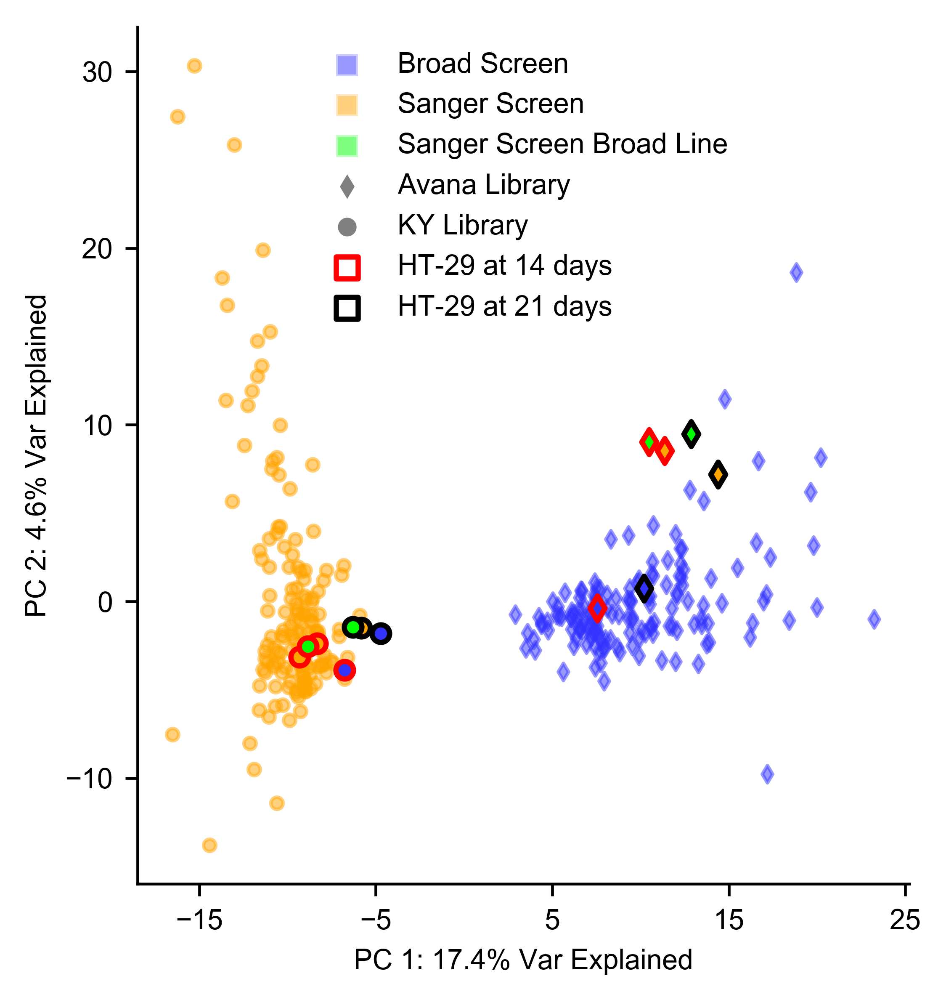

In [94]:
plt.close('all')
width = 4.0
height = (width-.5)# * var_explained[1]/var_explained[0] + .5
#fig, axs = plt.subplots(1, 2, figsize=(4, height), gridspec_kw = {'width_ratios':[width, 7.5-width]})
plt.figure(figsize=(5, 4))
fillcolors = {'Broad': [.2, .2, 1], 'Sanger': 'orange', 'BroadSource': 'lime', 'SangerSequencing': 'purple'}
markers = {'Avana': 'd', 'KY': 'o'}
edgecolors = {"D14": "red", "D21": "black"}
s = 12
s2 = 25
alpha=.5
lw=1.5
#plt.sca(axs[0])

#   SANGER SCREENS
########################

group = [s for s in comps.index 
         if 'KYD14_Sanger' in s 
         and not s.startswith('HT-29')
        ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'],
            s=s, alpha=alpha, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Sanger' in s 
         and not 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Sanger' in s 
         and not 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Sanger' in s 
         and 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['BroadSource'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Sanger' in s 
         and 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['BroadSource'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Sanger' in s 
         and not 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD21_Sanger' in s 
         and not 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Sanger' in s 
         and 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['BroadSource'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD21_Sanger' in s 
         and 'BroadSource' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['BroadSource'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )


#     BROAD SCREENS
##################################

group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and not s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'],
            s=s, alpha=alpha, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

# Sanger Sequencing
group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('HT-29') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

simpleaxis()
plt.xlabel("PC 1: %1.1f%% Var Explained" % (100*pca.explained_variance_ratio_[0]))
plt.ylabel("PC 2: %1.1f%% Var Explained" % (100*pca.explained_variance_ratio_[1]))
plt.gca().set_aspect('equal')#var_explained[1]/var_explained[0])

#plt.sca(axs[1])

#        LEGEND
#########################

plt.scatter([], [], marker='s', color=fillcolors['Broad'], alpha=.5, label="Broad Screen", 
            edgecolors='w', s=40)
plt.scatter([], [], marker='s', color=fillcolors['Sanger'], alpha=.5, label="Sanger Screen", 
            edgecolors='w', s=40)
plt.scatter([], [], marker='s', color=fillcolors['BroadSource'], alpha=.5, label="Sanger Screen Broad Line", 
            edgecolors='w', s=40)
# plt.scatter([], [], marker='s', color=fillcolors['SangerSequencing'], alpha=.5, label="Broad Screen Sanger Seq", 
#             edgecolors='w', s=40)

plt.scatter([], [], marker=markers['Avana'], color='gray', alpha=1, s=40, label="Avana Library", edgecolors='w')
plt.scatter([], [], marker=markers['KY'], color='gray', alpha=1, s=40, label="KY Library", edgecolors='w')
plt.scatter([], [], color='w', alpha=1, s=40, linewidths=lw, edgecolors=edgecolors['D14'],
            marker='s', label='HT-29 at 14 days')
plt.scatter([], [], color='w', alpha=1, s=40, linewidths=lw, edgecolors=edgecolors['D21'],
            marker='s', label='HT-29 at 21 days')

plt.legend(frameon=False)
# plt.axis('off')
# #sns.despine(left=True, bottom=True)
plt.xticks(range(-15, 30, 10))
# plt.yticks([])
# plt.xlabel('')
# plt.ylabel('')


plt.tight_layout()
#plt.subplots_adjust(wspace=0)
plt.savefig("FigurePanels/PC_HT-29_BIdecon.png", transparent=True)
#plt.savefig("FigurePanels/PC_HT-29.pdf", transparent=True)

## Supp 6A: PCA with JIMT-1 highlighted

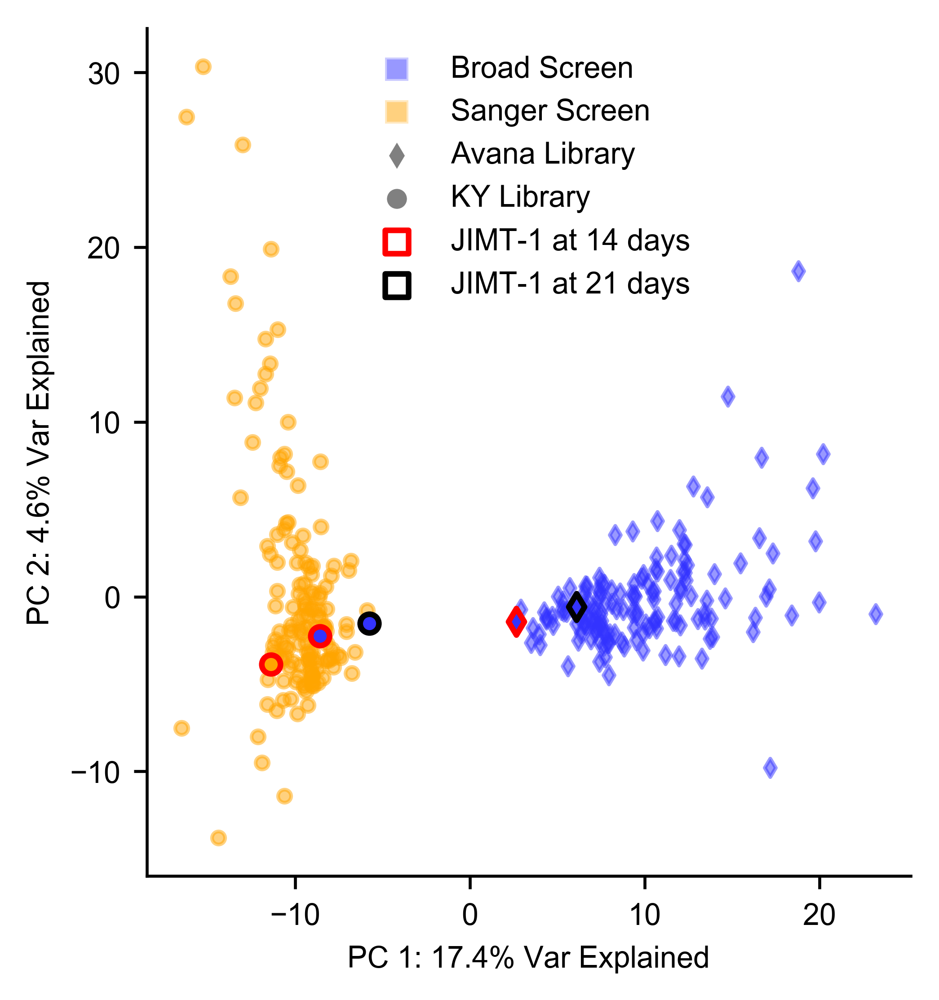

In [95]:
plt.close('all')
width = 6.0
height = width#(width-.5) * var_explained[1]/var_explained[0] + .5
#fig, axs = plt.subplots(1, 2, figsize=(7.5, height), gridspec_kw = {'width_ratios':[width, 7.5-width]})
plt.figure(figsize=(3.75, 3.75))
fillcolors = {'Broad': [.2, .2, 1], 'Sanger': 'orange', 'BroadSource': 'lime', 'SangerSequencing': 'purple'}
markers = {'Avana': 'd', 'KY': 'o'}
edgecolors = {"D14": "red", "D21": "black"}
s = 12
s2 = 25
alpha=.5
lw=1.5
#plt.sca(axs[0])

#   SANGER SCREENS
########################

group = [s for s in comps.index 
         if 'KYD14_Sanger' in s 
         and not s.startswith('JIMT-1')
        ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'],
            s=s, alpha=alpha, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Sanger' in s 
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Sanger' in s 
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Sanger' in s 
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD21_Sanger' in s 
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Sanger'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )


#     BROAD SCREENS
##################################

group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and not s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'],
            s=s, alpha=alpha, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Broad' in s 
         and not 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['Broad'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

# Sanger Sequencing
group = [s for s in comps.index 
         if 'AvanaD21_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['Avana'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'AvanaD14_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['Avana'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD14_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['KY'], 
            edgecolor=edgecolors['D14'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

group = [s for s in comps.index 
         if 'KYD21_Broad' in s 
         and 'SangerSequencing' in s
         and s.startswith('JIMT-1') 
         ]
plt.scatter(comps.loc[group, 1], comps.loc[group, 2],
            color=fillcolors['SangerSequencing'], marker=markers['KY'], 
            edgecolor=edgecolors['D21'], linewidth=lw,
            s=s2, alpha=1, label=None
           )

simpleaxis()
plt.xlabel("PC 1: %1.1f%% Var Explained" % (100*pca.explained_variance_ratio_[0]))
plt.ylabel("PC 2: %1.1f%% Var Explained" % (100*pca.explained_variance_ratio_[1]))
plt.gca().set_aspect('equal')#var_explained[1]/var_explained[0])

#plt.sca(axs[1])

#        LEGEND
#########################

plt.scatter([], [], marker='s', color=fillcolors['Broad'], alpha=.5, label="Broad Screen", 
            edgecolors='w', s=40)
plt.scatter([], [], marker='s', color=fillcolors['Sanger'], alpha=.5, label="Sanger Screen", 
            edgecolors='w', s=40)
# plt.scatter([], [], marker='s', color=fillcolors['BroadSource'], alpha=.5, label="Sanger Screen Broad Line", 
#             edgecolors='w', s=40)
# plt.scatter([], [], marker='s', color=fillcolors['SangerSequencing'], alpha=.5, label="Broad Screen Sanger Seq", 
#             edgecolors='w', s=40)

plt.scatter([], [], marker=markers['Avana'], color='gray', alpha=1, s=40, label="Avana Library", edgecolors='w')
plt.scatter([], [], marker=markers['KY'], color='gray', alpha=1, s=40, label="KY Library", edgecolors='w')
plt.scatter([], [], color='w', alpha=1, s=40, linewidths=lw, edgecolors=edgecolors['D14'],
            marker='s', label='JIMT-1 at 14 days')
plt.scatter([], [], color='w', alpha=1, s=40, linewidths=lw, edgecolors=edgecolors['D21'],
            marker='s', label='JIMT-1 at 21 days')

plt.legend(frameon=False)
# plt.axis('off')
# #sns.despine(left=True, bottom=True)
# plt.xticks([])
# plt.yticks([])
# plt.xlabel('')
# plt.ylabel('')


plt.tight_layout()
#plt.subplots_adjust(wspace=0)
plt.savefig("FigurePanels/PC_JIMT-1.png", transparent=True)
plt.savefig("FigurePanels/PC_JIMT-1.pdf", transparent=True)

## Panel B: Consistency of Library and Timepoint Changes

In [96]:
library_diffs = pd.DataFrame({
    'HT-29 D21 Broad': broad_data['unprocessed']['HT-29'] - broad_data['alternateLib']['HT-29_KYD21_Broad'],
    'HT-29 D14 Broad': broad_data['alternateTP']['HT-29_AvanaD14_Broad'] -\
                        broad_data['alternateLib']['HT-29_KYD14_Broad'],
    'JIMT-1 D21 Broad': broad_data['unprocessed']['JIMT-1'] - broad_data['alternateLib']['JIMT-1_KYD21_Broad'],
    'JIMT-1 D14 Broad': broad_data['alternateTP']['JIMT-1_AvanaD14_Broad'] -\
                        broad_data['alternateLib']['JIMT-1_KYD14_Broad'],
    'HT-29 D21 Sanger': sanger_data['alternateLib']['HT-29_AvanaD21_Sanger_SangerSource'] -\
                        sanger_data['alternateTP']['HT-29_KYD21_Sanger_SangerSource'],
    'HT-29 D14 Sanger': sanger_data['alternateLib']['HT-29_AvanaD14_Sanger_SangerSource'] -\
                        sanger_data['alternateTP']['HT-29_KYD14_Sanger_SangerSource'],
})

In [97]:
timepoint_diffs = pd.DataFrame({
    'HT-29 Avana Broad': broad_data['unprocessed']['HT-29'] - broad_data['alternateTP']['HT-29_AvanaD14_Broad'],
    'HT-29 KY Broad':  broad_data['alternateLib']['HT-29_KYD21_Broad']-\
                        broad_data['alternateLib']['HT-29_KYD14_Broad'],
    'JIMT-1 Avana Broad': broad_data['unprocessed']['JIMT-1'] - broad_data['alternateTP']['JIMT-1_AvanaD14_Broad'],
    'JIMT-1 KY Broad': broad_data['alternateLib']['JIMT-1_KYD21_Broad'] - \
                        broad_data['alternateLib']['JIMT-1_KYD14_Broad'],
    'HT-29 Avana Sanger': sanger_data['alternateLib']['HT-29_AvanaD21_Sanger_SangerSource'] -\
                        sanger_data['alternateLib']['HT-29_AvanaD14_Sanger_SangerSource'],
    'HT-29 KY Sanger': sanger_data['alternateTP']['HT-29_KYD21_Sanger_SangerSource'] -\
                        sanger_data['alternateTP']['HT-29_KYD14_Sanger_SangerSource'],
})

In [98]:
norm = Normalize(vmin=-1, vmax=1, clip=True)

mappable = ScalarMappable(norm, 'PiYG')
mappable.set_array([-1, 1])

In [99]:
mappable = ScalarMappable(norm, 'PiYG')
mappable.set_array([-1, 1])

Library difference mean correlation: 0.521525
Timepoint difference mean correlation: 0.374746


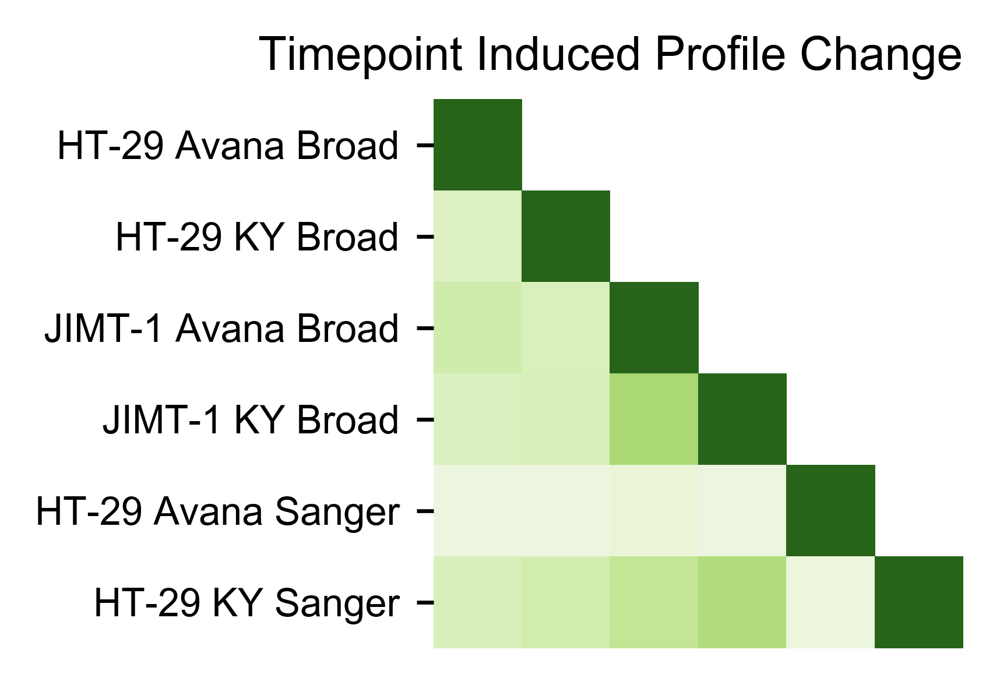

In [100]:
plt.close('all')
plt.figure(figsize=(2.9, 2.0))
df = covar(library_diffs)
mask = np.tri(df.shape[0], k=0)
print("Library difference mean correlation: %f" % df[mask==1].mean().mean())
mask = np.tri(df.shape[0], k=-1)
df.mask(mask == 1, inplace=True)
sns.heatmap(df.T, vmin=-1, vmax=1, xticklabels=[], cmap='PiYG', cbar=None,
            cbar_kws=dict(label="Correlation"))
plt.title("Library Induced Profile Change", loc='right')
plt.tight_layout()
plt.savefig('FigurePanels/condition_effect_consistency_heatmap_1.png', transparent='True')

plt.close('all')
plt.figure(figsize=(2.9, 2))
df = covar(timepoint_diffs)
mask = np.tri(df.shape[0], k=0)
print("Timepoint difference mean correlation: %f" % df[mask==1].mean().mean())
mask = np.tri(df.shape[0], k=-1)
df.mask(mask == 1, inplace=True)
sns.heatmap(df.T, vmin=-1, vmax=1, xticklabels=[], cmap='PiYG', cbar=None,
            cbar_kws=dict(label="Correlation"))
plt.title("Timepoint Induced Profile Change", loc='right')
plt.tight_layout()
plt.savefig('FigurePanels/condition_effect_consistency_heatmap_2.png', transparent='True')

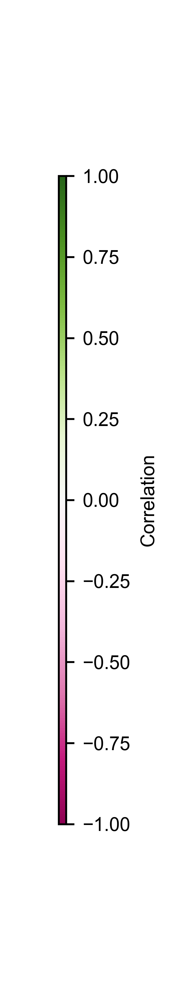

In [101]:
plt.close('all')
plt.figure(figsize=(1, 6))
plt.colorbar(mappable=mappable, label='Correlation', pad=0, aspect=88, shrink=1)

plt.axis('off')
#sns.despine(left=True, bottom=True)
plt.xticks([])
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.tight_layout()
plt.savefig('FigurePanels/condition_effect_consistency_heatmap_colorbar.png', transparent='True')

## Panel C: Difference in Cell Profiles under Changing Broad Conditions

HT-29 screen diff variance: 0.0486. Correlation with average screen diff rho 0.685, p-val 0.000000E+00


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


HT-29 screen diff variance: 0.0389. Correlation with average screen diff rho 0.672, p-val 0.000000E+00
HT-29 screen diff variance: 0.0303. Correlation with average screen diff rho 0.176, p-val 8.850744E-117
HT-29 screen diff variance: 0.0252. Correlation with average screen diff rho 0.101, p-val 4.786826E-39
JIMT-1 screen diff variance: 0.0556. Correlation with average screen diff rho 0.598, p-val 0.000000E+00
JIMT-1 screen diff variance: 0.0427. Correlation with average screen diff rho 0.564, p-val 0.000000E+00
JIMT-1 screen diff variance: 0.0365. Correlation with average screen diff rho 0.216, p-val 8.834201E-176
JIMT-1 screen diff variance: 0.0260. Correlation with average screen diff rho 0.141, p-val 8.655219E-75


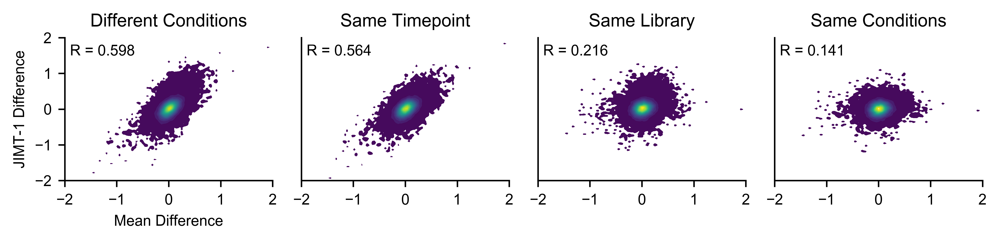

In [102]:
for cell_line in ['HT-29', 'JIMT-1']:
    plt.close('all')
    fig, axs = plt.subplots(1, 4, figsize=(7.5, 1.85))

    means = (sanger_data['unprocessed'].mean(axis=1) - broad_data['unprocessed'].mean(axis=1))
    ref = sanger_data['unprocessed'][cell_line]
    diffs = [
        ref - broad_data['unprocessed'][cell_line],
        ref - broad_data['alternateTP'][cell_line + '_AvanaD14_Broad'],
        ref - broad_data['alternateLib'][cell_line + '_KYD21_Broad'],
        ref - broad_data['alternateLib'][cell_line + '_KYD14_Broad'],
    ]
    titles = ['Different Conditions', 'Same Timepoint', 'Same Library', 'Same Conditions']

    for diff, ax, title in zip(diffs, axs, titles):
        plt.sca(ax)
        mask = diff.notnull()
        r, p = pearsonr(means[mask], diff[mask])
        print("%s screen diff variance: %1.4f. Correlation with average screen diff rho %1.3f, p-val %E" % 
            (cell_line, diff[mask].var(), r, p)
        )
        sns.kdeplot(means[mask], diff[mask], shade=True, levels=np.linspace(.01, 10, 20), cmap='viridis')
        if title == 'Different Conditions':
            plt.ylabel("%s Difference" % cell_line)
            plt.xlabel("Mean Difference")
        else:
            plt.yticks([])
        plt.title(title)
        simpleaxis()
        plt.xlim(-2, 2)
        plt.ylim(-2, 2)
        plt.text(-1.9, 1.5, "R = %1.3f" % r)

    plt.tight_layout()
    plt.savefig("FigurePanels/conditions_vs_difference_scatter_%s.png" % cell_line, transparent=True)

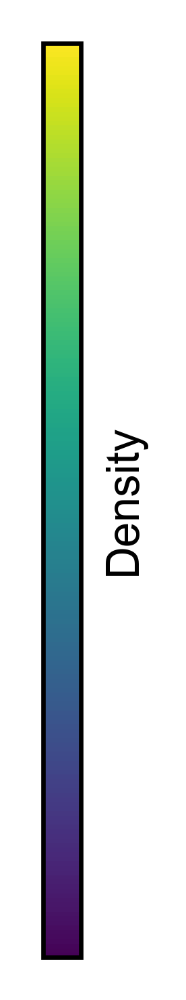

In [103]:
norm = mpl.colors.Normalize(vmin=0, vmax=1)
plt.close('all')
plt.figure(figsize=(.5, 2.5))
cb1 = mpl.colorbar.ColorbarBase(plt.gca(), 
                                cmap=ListedColormap(
                                    sns.color_palette("viridis", n_colors=200)
                                ), ticks=[],
                                norm=norm,
                                orientation='vertical')
cb1.set_label('Density')
plt.tight_layout()
plt.savefig("FigurePanels/scatter_colorbar_viridis.png")

## Panel D: Difference in Cell Profiles under Changing Sanger Conditions

HT-29 screen diff variance: 0.0486. Correlation with average screen diff rho 0.685, p-val 0.000000E+00


/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


HT-29 screen diff variance: 0.0374. Correlation with average screen diff rho 0.654, p-val 0.000000E+00
HT-29 screen diff variance: 0.1086. Correlation with average screen diff rho 0.013, p-val 9.824567E-02
HT-29 screen diff variance: 0.1153. Correlation with average screen diff rho -0.050, p-val 4.252550E-10


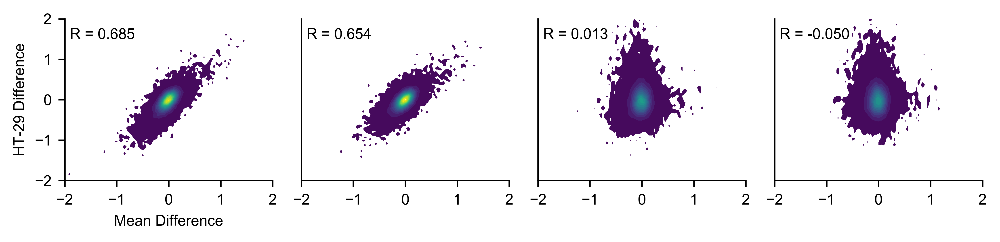

In [104]:
for cell_line in ['HT-29']:
    plt.close('all')
    fig, axs = plt.subplots(1, 4, figsize=(7.5, 1.85))

    means = (broad_data['unprocessed'].mean(axis=1) - sanger_data['unprocessed'].mean(axis=1))
    ref = broad_data['unprocessed'][cell_line]
    diffs = [
        ref - sanger_data['unprocessed'][cell_line],
        ref - sanger_data['alternateTP'][cell_line + '_KYD21_Sanger_SangerSource'],
        ref - sanger_data['alternateLib'][cell_line + '_AvanaD14_Sanger_SangerSource'],
        ref - sanger_data['alternateLib'][cell_line + '_AvanaD21_Sanger_SangerSource'],
    ]
    titles = ['Different Conditions', 'Same TP', 'Same Library', 'Same Conditions']

    for diff, ax, title in zip(diffs, axs, titles):
        plt.sca(ax)
        mask = diff.notnull()
        r, p = pearsonr(means[mask], diff[mask])
        print("%s screen diff variance: %1.4f. Correlation with average screen diff rho %1.3f, p-val %E" % 
            (cell_line, diff[mask].var(), r, p)
        )
        sns.kdeplot(means[mask], diff[mask], shade=True, levels=np.linspace(.01, 10, 20), cmap='viridis')
        if title == 'Different Conditions':
            plt.ylabel("%s Difference" % cell_line)
            plt.xlabel("Mean Difference")
        else:
            plt.yticks([])
        #plt.title(title)
        simpleaxis()
        plt.xlim(-2, 2)
        plt.ylim(-2, 2)
        plt.text(-1.9, 1.5, "R = %1.3f" % r)

    plt.tight_layout()
    plt.savefig("FigurePanels/conditions_vs_difference_scatter_BroadRef.png", transparent=True)

## Supp 6B: Depletion of Broad and Sanger-Exclusive Essentials

/usr/local/lib/python3.6/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)
/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


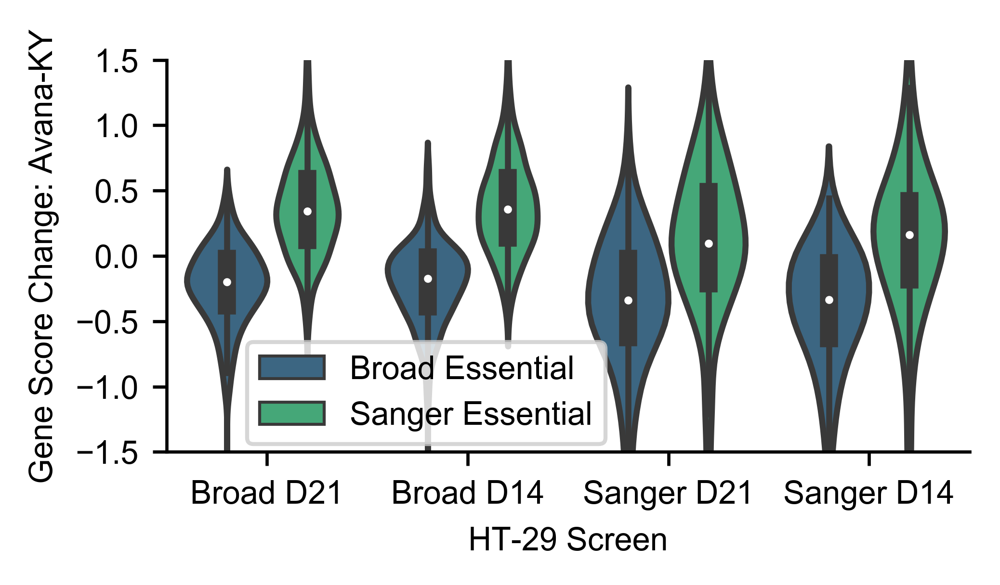

In [105]:
df = pd.DataFrame(columns=["Score", "Gene", "Institute", "Timepoint", "Category"])

df = df.append(pd.DataFrame({
    "Score": (broad_data['unprocessed']['HT-29'] - broad_data['alternateLib']['HT-29_KYD21_Broad']).values,
    "Gene": broad_data['unprocessed'].index,
    "Institute": "Broad",
    "Timepoint": "D21",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        broad_data['alternateTP']['HT-29_AvanaD14_Broad'] - 
        broad_data['alternateLib']['HT-29_KYD14_Broad']
    ).values,
    "Gene": broad_data['alternateLib'].index,
    "Institute": "Broad",
    "Timepoint": "D14",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        sanger_data['alternateLib']['HT-29_AvanaD21_Sanger_SangerSource'] - 
        sanger_data['alternateTP']['HT-29_KYD21_Sanger_SangerSource'].loc[sanger_data['alternateLib'].index]
    ).values,
    "Gene": sanger_data['alternateLib'].index,
    "Institute": "Sanger",
    "Timepoint": "D21",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        sanger_data['alternateLib']['HT-29_AvanaD14_Sanger_SangerSource'] - 
        sanger_data['alternateTP']['HT-29_KYD14_Sanger_SangerSource'].loc[sanger_data['alternateLib'].index]
    ).values,
    "Gene": sanger_data['alternateLib'].index,
    "Institute": "Sanger",
    "Timepoint": "D14",
}), ignore_index=True)

df.loc[df.index[df.Gene.isin(set(sanger_ess) - set(broad_ess))], "Category"] = "Sanger Essential"
df.loc[df.index[df.Gene.isin(set(broad_ess) - set(sanger_ess))], "Category"] = "Broad Essential"
df.dropna(subset=['Category'], inplace=True)

df['X'] = df.apply(lambda x: '%s %s' % (x['Institute'], x['Timepoint']), axis=1)

plt.close('all')
sns.violinplot(data=df, hue='Category', x='X', y='Score', legend=False, ax=plt.gca(), palette="viridis")
plt.gcf().set_size_inches(3.5, 2.0)
plt.ylabel("Gene Score Change: Avana-KY")
plt.xlabel("HT-29 Screen")
plt.ylim(-1.5, 1.5)
plt.legend(loc=(.1, .02))
simpleaxis()
plt.tight_layout()
plt.savefig("FigurePanels/exclusive_essential_change.png", transparent=True)

## Supp 6C: Depletion of Late and Early Essentials in the Later Condition

/usr/local/lib/python3.6/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)
/usr/local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


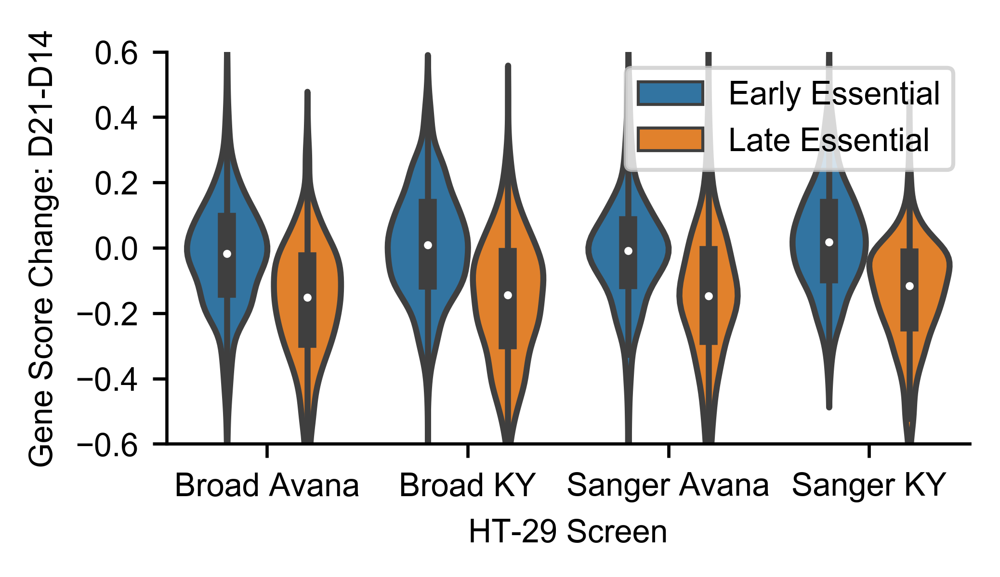

In [106]:
df = pd.DataFrame(columns=["Score", "Gene", "Institute", "Library", "Category"])

df = df.append(pd.DataFrame({
    "Score": (broad_data['unprocessed']['HT-29'] - broad_data['alternateTP']['HT-29_AvanaD14_Broad']).values,
    "Gene": broad_data['unprocessed'].index,
    "Institute": "Broad",
    "Library": "Avana",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        broad_data['alternateLib']['HT-29_KYD21_Broad'] - 
        broad_data['alternateLib']['HT-29_KYD14_Broad']
    ).values,
    "Gene": broad_data['alternateLib'].index,
    "Institute": "Broad",
    "Library": "KY",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        sanger_data['alternateLib']['HT-29_AvanaD21_Sanger_SangerSource'] - 
        sanger_data['alternateLib']['HT-29_AvanaD14_Sanger_SangerSource']
    ).values,
    "Gene": sanger_data['alternateLib'].index,
    "Institute": "Sanger",
    "Library": "Avana",
}), ignore_index=True)

df = df.append(pd.DataFrame({
    "Score": (
        sanger_data['alternateTP']['HT-29_KYD21_Sanger_SangerSource'] - 
        sanger_data['alternateTP']['HT-29_KYD14_Sanger_SangerSource']
    ).values,
    "Gene": broad_data['alternateTP'].index,
    "Institute": "Sanger",
    "Library": "KY",
}), ignore_index=True)

df.loc[df.index[df.Gene.isin(set(late_essentials))], "Category"] = "Late Essential"
df.loc[df.index[df.Gene.isin(set(early_essentials))], "Category"] = "Early Essential"
df.dropna(subset=['Category'], inplace=True)

df['X'] = df.apply(lambda x: '%s %s' % (x['Institute'], x['Library']), axis=1)
plt.close('all')
sns.violinplot(data=df, hue='Category', x='X', y='Score', legend=False, ax=plt.gca())
plt.gcf().set_size_inches(3.5, 2.0)
plt.ylabel("Gene Score Change: D21-D14")
plt.xlabel("HT-29 Screen")
plt.ylim(-.6, .6)
plt.legend(loc="upper right")
simpleaxis()
plt.tight_layout()
plt.savefig("FigurePanels/late_essential_change.png", transparent=True)